In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    #print("Agg:")
    agg.columns = names
    #print(type(agg))
    #print(agg)

    #print("Test columns:")
    #print(agg.iloc[:, -36]) # Column containing response actual values (temperature) at time t

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    #print("Scaled values rows:")
    #print(len(scaled_values))

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
    #print("Train_X Fold "+str(i)+":")
    #print(len(train_X[i]))
    #print(len(train_X[i][0]))
    #print(len(train_X[i][0][0])) 
    #print("Train_y Fold "+str(i)+":")
    #print(len(train_y[i]))
    #print(len(train_y[i][0]))
    #print(train_y[i][0][0])
    #print("Validation_X Fold "+str(i)+":")
    #print(len(val_X[i]))
    #print(len(val_X[i][0]))
    #print(len(val_X[i][0][0]))
    #print("Validation_y Fold "+str(i)+":")
    #print(len(val_y[i]))
    #print(len(val_y[i][0]))
    #print(val_y[i][0][0])
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
     

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]


Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2154)
(11, 1, 1, 2154)
(10, 1, 1, 2154)
(84, 1, 2154)
(11, 1, 2154)
(10, 1, 2154)
(84, 2154)
(11, 2154)
(10, 2154)
[[0.39307412 0.69695044 0.32924264 ... 0.59173755 0.63122722 0.7436209 ]
 [0.45747266 0.51683609 0.42215989 ... 0.54708384 0.62606318 0.55285541]
 [0.38487242 0.62674714 0.3411641  ... 0.56014581 0.64854192 0.66281896]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.63153098 0.55467801 0.62697448]
 [0.44896719 0.51620076 0.3997195  ... 0.55042527 0.62697448 0.57837181]
 [0.46780073 0.52414231 0.42356241 ... 0.54829891 0.55923451 0.52885784]]
Fold 2:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2154)
(11, 1, 1, 2154)
(10, 1, 1, 2154)
(84, 1, 2154)
(11, 1, 2154)
(10, 1, 2154)
(84, 2154)
(11, 2154)
(10, 2154)
[[0.38166311 0.6

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 2154)
(11, 2154)


[I 2025-05-22 01:46:42,215] A new study created in memory with name: no-name-4a177292-b87c-4227-84f5-8563f4694ba0
[I 2025-05-22 01:52:07,963] Trial 0 finished with value: 0.17423393428325654 and parameters: {'lr': 0.3142386558778148, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22592779315944927}. Best is trial 0 with value: 0.17423393428325654.


Cross Validation Accuracies:
[0.17306369543075562, 0.16281883418560028, 0.1847921460866928, 0.1725759506225586, 0.17791904509067535]
Mean Cross Validation Accuracy:
0.17423393428325654
Standard Deviation of Cross Validation Accuracy:
0.007203870587118176


[I 2025-05-22 02:00:39,549] Trial 1 finished with value: 0.22413858771324158 and parameters: {'lr': 0.0035962733014463424, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3577488609800462}. Best is trial 0 with value: 0.17423393428325654.


Cross Validation Accuracies:
[0.2239646315574646, 0.20359180867671967, 0.22437730431556702, 0.23762115836143494, 0.23113803565502167]
Mean Cross Validation Accuracy:
0.22413858771324158
Standard Deviation of Cross Validation Accuracy:
0.011428292592589932


[I 2025-05-22 02:05:36,806] Trial 2 finished with value: 0.08129145801067353 and parameters: {'lr': 0.0011911098314246707, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4710665895967143}. Best is trial 2 with value: 0.08129145801067353.


Cross Validation Accuracies:
[0.07226011157035828, 0.07302231341600418, 0.09035162627696991, 0.09916365146636963, 0.07165958732366562]
Mean Cross Validation Accuracy:
0.08129145801067353
Standard Deviation of Cross Validation Accuracy:
0.011350936980841863


[I 2025-05-22 02:14:33,400] Trial 3 finished with value: 0.9321406483650208 and parameters: {'lr': 0.014178198408364139, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.349218173604784}. Best is trial 2 with value: 0.08129145801067353.


Cross Validation Accuracies:
[0.8910121917724609, 0.9136354923248291, 0.9549619555473328, 0.9347715973854065, 0.9663220047950745]
Mean Cross Validation Accuracy:
0.9321406483650208
Standard Deviation of Cross Validation Accuracy:
0.027313329432398413


[I 2025-05-22 02:21:30,962] Trial 4 finished with value: 0.29720919728279116 and parameters: {'lr': 0.03809540664195461, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2455120155033511}. Best is trial 2 with value: 0.08129145801067353.


Cross Validation Accuracies:
[0.1899125576019287, 0.30856406688690186, 0.5441722869873047, 0.1769782304763794, 0.26641884446144104]
Mean Cross Validation Accuracy:
0.29720919728279116
Standard Deviation of Cross Validation Accuracy:
0.13269197476335823


[I 2025-05-22 02:27:12,893] Trial 5 finished with value: 0.06653041467070579 and parameters: {'lr': 0.030268371594291597, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33824538577591157}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.052722491323947906, 0.049469176679849625, 0.08185428380966187, 0.08491826057434082, 0.06368786096572876]
Mean Cross Validation Accuracy:
0.06653041467070579
Standard Deviation of Cross Validation Accuracy:
0.014579153218619604


[I 2025-05-22 02:33:22,247] Trial 6 finished with value: 19.132315826416015 and parameters: {'lr': 0.23268572927811787, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3136402288282448}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[18.29521942138672, 11.048114776611328, 23.75934600830078, 24.66077423095703, 17.89812469482422]
Mean Cross Validation Accuracy:
19.132315826416015
Standard Deviation of Cross Validation Accuracy:
4.889816466680294


[I 2025-05-22 02:37:36,675] Trial 7 finished with value: 0.3150504767894745 and parameters: {'lr': 0.6021810179244531, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19613395224046748}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.3071029782295227, 0.3218323588371277, 0.29665079712867737, 0.2990782856941223, 0.35058796405792236]
Mean Cross Validation Accuracy:
0.3150504767894745
Standard Deviation of Cross Validation Accuracy:
0.01982790336283799


[I 2025-05-22 02:42:39,834] Trial 8 finished with value: 8.25210657119751 and parameters: {'lr': 0.08217628025760265, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.34015273473975927}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[8.389570236206055, 8.252442359924316, 6.874393939971924, 8.961051940917969, 8.783074378967285]
Mean Cross Validation Accuracy:
8.25210657119751
Standard Deviation of Cross Validation Accuracy:
0.7350535784997033


[I 2025-05-22 02:51:55,591] Trial 9 finished with value: 0.5892245888710022 and parameters: {'lr': 0.009601333859284421, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.14745284158665736}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.5761622190475464, 0.6206929087638855, 0.5933215618133545, 0.5896444320678711, 0.5663018226623535]
Mean Cross Validation Accuracy:
0.5892245888710022
Standard Deviation of Cross Validation Accuracy:
0.01845695169058127


[I 2025-05-22 02:56:59,972] Trial 10 finished with value: 0.10739825665950775 and parameters: {'lr': 0.09230508723997381, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4497781869400993}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.08397821336984634, 0.12583763897418976, 0.08920599520206451, 0.11817104369401932, 0.11979839205741882]
Mean Cross Validation Accuracy:
0.10739825665950775
Standard Deviation of Cross Validation Accuracy:
0.017258527881311686


[I 2025-05-22 03:02:17,439] Trial 11 finished with value: 0.08564433157444 and parameters: {'lr': 0.0017333904862617262, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4903202630994781}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.055089231580495834, 0.05774661526083946, 0.1002902090549469, 0.14403608441352844, 0.07105951756238937]
Mean Cross Validation Accuracy:
0.08564433157444
Standard Deviation of Cross Validation Accuracy:
0.03331279645336123


[I 2025-05-22 03:08:19,537] Trial 12 finished with value: 0.07138956114649772 and parameters: {'lr': 0.0011799921263137055, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.42049694891687456}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.05763966217637062, 0.05517309904098511, 0.0873727798461914, 0.09037014842033386, 0.06639211624860764]
Mean Cross Validation Accuracy:
0.07138956114649772
Standard Deviation of Cross Validation Accuracy:
0.014783327052308793


[I 2025-05-22 03:15:20,660] Trial 13 finished with value: 0.07140274569392205 and parameters: {'lr': 0.006443645493734183, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4082434233132369}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.04976176097989082, 0.06170491874217987, 0.07979462295770645, 0.08232244849205017, 0.0834299772977829]
Mean Cross Validation Accuracy:
0.07140274569392205
Standard Deviation of Cross Validation Accuracy:
0.013391772699994933


[I 2025-05-22 03:23:32,495] Trial 14 finished with value: 0.08172920644283295 and parameters: {'lr': 0.020318511967560245, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.39421258333169407}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.05095960944890976, 0.08860795199871063, 0.12797896564006805, 0.07838506251573563, 0.06271444261074066]
Mean Cross Validation Accuracy:
0.08172920644283295
Standard Deviation of Cross Validation Accuracy:
0.026479690359173667


[I 2025-05-22 03:30:24,889] Trial 15 finished with value: 0.07231638804078103 and parameters: {'lr': 0.0031823342474977126, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.26923586975281366}. Best is trial 5 with value: 0.06653041467070579.


Cross Validation Accuracies:
[0.06146906688809395, 0.052205368876457214, 0.08746381849050522, 0.09081374108791351, 0.06962994486093521]
Mean Cross Validation Accuracy:
0.07231638804078103
Standard Deviation of Cross Validation Accuracy:
0.01483867355227795


[I 2025-05-22 03:34:30,800] Trial 16 finished with value: 0.06617717966437339 and parameters: {'lr': 0.05025058446548901, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.42305519974976635}. Best is trial 16 with value: 0.06617717966437339.


Cross Validation Accuracies:
[0.05256354808807373, 0.05098927393555641, 0.0759250670671463, 0.08484474569559097, 0.06656326353549957]
Mean Cross Validation Accuracy:
0.06617717966437339
Standard Deviation of Cross Validation Accuracy:
0.013112222055969049


[I 2025-05-22 03:40:03,194] Trial 17 finished with value: 0.14601469784975052 and parameters: {'lr': 0.043269076103390335, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.29797419308510487}. Best is trial 16 with value: 0.06617717966437339.


Cross Validation Accuracies:
[0.14080296456813812, 0.15843665599822998, 0.17017118632793427, 0.16111212968826294, 0.09955055266618729]
Mean Cross Validation Accuracy:
0.14601469784975052
Standard Deviation of Cross Validation Accuracy:
0.025107179767531185


[I 2025-05-22 03:45:04,992] Trial 18 finished with value: 0.06503254845738411 and parameters: {'lr': 0.11179767832381689, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3867500951552318}. Best is trial 18 with value: 0.06503254845738411.


Cross Validation Accuracies:
[0.05441616475582123, 0.04977898672223091, 0.07335332036018372, 0.0814039334654808, 0.06621033698320389]
Mean Cross Validation Accuracy:
0.06503254845738411
Standard Deviation of Cross Validation Accuracy:
0.011696353504064805


[I 2025-05-22 03:49:24,133] Trial 19 finished with value: 0.06479858607053757 and parameters: {'lr': 0.12378069092693215, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3866653436292606}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.052885208278894424, 0.05863659456372261, 0.06865967810153961, 0.08213967829942703, 0.061671771109104156]
Mean Cross Validation Accuracy:
0.06479858607053757
Standard Deviation of Cross Validation Accuracy:
0.01005283236607711


[I 2025-05-22 03:54:07,602] Trial 20 finished with value: 0.06606832966208458 and parameters: {'lr': 0.19799513891758708, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3875415455473043}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.04940332472324371, 0.051195915788412094, 0.07749473303556442, 0.0810057744383812, 0.07124190032482147]
Mean Cross Validation Accuracy:
0.06606832966208458
Standard Deviation of Cross Validation Accuracy:
0.013261725890261122


[I 2025-05-22 03:58:56,519] Trial 21 finished with value: 0.06715542525053024 and parameters: {'lr': 0.160123264972106, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.37641106538199487}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.057597097009420395, 0.0530436672270298, 0.07448563724756241, 0.0851917564868927, 0.06545896828174591]
Mean Cross Validation Accuracy:
0.06715542525053024
Standard Deviation of Cross Validation Accuracy:
0.011596745853167452


[I 2025-05-22 04:04:03,482] Trial 22 finished with value: 0.07719161212444306 and parameters: {'lr': 0.920069974769997, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4404868413510941}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.07672222703695297, 0.06139750778675079, 0.0911770835518837, 0.07621293514966965, 0.08044830709695816]
Mean Cross Validation Accuracy:
0.07719161212444306
Standard Deviation of Cross Validation Accuracy:
0.009558570353384265


[I 2025-05-22 04:09:06,169] Trial 23 finished with value: 0.06762446314096451 and parameters: {'lr': 0.11757225556611293, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.38385271383893427}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05218561738729477, 0.054100826382637024, 0.07305194437503815, 0.08452428132295609, 0.07425964623689651]
Mean Cross Validation Accuracy:
0.06762446314096451
Standard Deviation of Cross Validation Accuracy:
0.012492668019473893


[I 2025-05-22 04:15:28,479] Trial 24 finished with value: 0.07058719396591187 and parameters: {'lr': 0.3350889682792411, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.31421857308554735}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.06500650942325592, 0.04878035932779312, 0.07263334840536118, 0.09831507503986359, 0.06820067763328552]
Mean Cross Validation Accuracy:
0.07058719396591187
Standard Deviation of Cross Validation Accuracy:
0.016033712445632016


[I 2025-05-22 04:20:56,481] Trial 25 finished with value: 0.07305825054645539 and parameters: {'lr': 0.20570356142728782, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4580749196138708}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.06770914047956467, 0.06186404079198837, 0.07091832160949707, 0.07997292280197144, 0.08482682704925537]
Mean Cross Validation Accuracy:
0.07305825054645539
Standard Deviation of Cross Validation Accuracy:
0.008304392713418688


[I 2025-05-22 04:25:40,628] Trial 26 finished with value: 0.07343369051814079 and parameters: {'lr': 0.5126027301020877, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.49735153808108207}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.04917778819799423, 0.05968856438994408, 0.087987020611763, 0.09586881846189499, 0.07444626092910767]
Mean Cross Validation Accuracy:
0.07343369051814079
Standard Deviation of Cross Validation Accuracy:
0.017282574872675906


[I 2025-05-22 04:31:10,925] Trial 27 finished with value: 0.06780743524432183 and parameters: {'lr': 0.06516957418038224, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.37894938926271043}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05477963760495186, 0.05630172789096832, 0.07944688200950623, 0.08449476957321167, 0.06401415914297104]
Mean Cross Validation Accuracy:
0.06780743524432183
Standard Deviation of Cross Validation Accuracy:
0.012086667072590132


[I 2025-05-22 04:37:21,721] Trial 28 finished with value: 0.06585627272725106 and parameters: {'lr': 0.16120877367632044, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10361338544197884}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.0525793693959713, 0.05047495663166046, 0.0706348568201065, 0.07984303683042526, 0.07574914395809174]
Mean Cross Validation Accuracy:
0.06585627272725106
Standard Deviation of Cross Validation Accuracy:
0.012076376808471578


[I 2025-05-22 04:42:00,329] Trial 29 finished with value: 0.07362538278102874 and parameters: {'lr': 0.3321453664249304, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11334794295399257}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.06852113455533981, 0.05498667061328888, 0.08591019362211227, 0.0861569494009018, 0.07255196571350098]
Mean Cross Validation Accuracy:
0.07362538278102874
Standard Deviation of Cross Validation Accuracy:
0.01168386840709602


[I 2025-05-22 04:46:54,975] Trial 30 finished with value: 0.09985553175210952 and parameters: {'lr': 0.026061843801156753, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.19128510746676083}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.0786026194691658, 0.08343136310577393, 0.11716621369123459, 0.12595655024051666, 0.09412091225385666]
Mean Cross Validation Accuracy:
0.09985553175210952
Standard Deviation of Cross Validation Accuracy:
0.018629269080397314


[I 2025-05-22 04:51:02,253] Trial 31 finished with value: 0.06643166467547416 and parameters: {'lr': 0.11421863191479333, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2767323344645635}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.06207146868109703, 0.04791259765625, 0.07214490324258804, 0.08762136846780777, 0.06240798532962799]
Mean Cross Validation Accuracy:
0.06643166467547416
Standard Deviation of Cross Validation Accuracy:
0.013113365621240661


[I 2025-05-22 04:54:45,826] Trial 32 finished with value: 0.06886250451207161 and parameters: {'lr': 0.1613132191771694, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3607296812415973}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05421344190835953, 0.05906832590699196, 0.0827919989824295, 0.07765113562345505, 0.07058762013912201]
Mean Cross Validation Accuracy:
0.06886250451207161
Standard Deviation of Cross Validation Accuracy:
0.010814507354975328


[I 2025-05-22 04:58:56,465] Trial 33 finished with value: 0.06766824945807456 and parameters: {'lr': 0.45550409179436, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10451278830109595}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.050525858998298645, 0.06175226345658302, 0.0750647559762001, 0.08660005033016205, 0.06439831852912903]
Mean Cross Validation Accuracy:
0.06766824945807456
Standard Deviation of Cross Validation Accuracy:
0.012269264707050549


[I 2025-05-22 05:04:18,518] Trial 34 finished with value: 0.0675202913582325 and parameters: {'lr': 0.24137571682848089, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4074724484787697}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05441153421998024, 0.05286206305027008, 0.0858805850148201, 0.0803433284163475, 0.06410394608974457]
Mean Cross Validation Accuracy:
0.0675202913582325
Standard Deviation of Cross Validation Accuracy:
0.01341570160954299


[I 2025-05-22 05:07:55,649] Trial 35 finished with value: 0.07259067967534065 and parameters: {'lr': 0.07052224140276896, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2357757097452084}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.0522211529314518, 0.059446707367897034, 0.09115613251924515, 0.0830918550491333, 0.07703755050897598]
Mean Cross Validation Accuracy:
0.07259067967534065
Standard Deviation of Cross Validation Accuracy:
0.01457674182751602


[I 2025-05-22 05:13:40,148] Trial 36 finished with value: 0.07046782895922661 and parameters: {'lr': 0.1481065064590108, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3540942413413433}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05559142678976059, 0.05553828552365303, 0.0968635305762291, 0.08098511397838593, 0.0633607879281044]
Mean Cross Validation Accuracy:
0.07046782895922661
Standard Deviation of Cross Validation Accuracy:
0.016137254964512935


[I 2025-05-22 05:17:28,594] Trial 37 finished with value: 0.074029241502285 and parameters: {'lr': 0.9355148731992158, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.15391366111514918}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.0599057674407959, 0.07520633935928345, 0.07792998850345612, 0.08052677661180496, 0.0765773355960846]
Mean Cross Validation Accuracy:
0.074029241502285
Standard Deviation of Cross Validation Accuracy:
0.0072771512572977655


[I 2025-05-22 05:24:28,052] Trial 38 finished with value: 0.07212188243865966 and parameters: {'lr': 0.05515976865537366, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3322087625424323}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05029241740703583, 0.06503551453351974, 0.08856334537267685, 0.08029638230800629, 0.07642175257205963]
Mean Cross Validation Accuracy:
0.07212188243865966
Standard Deviation of Cross Validation Accuracy:
0.013284390752628434


[I 2025-05-22 05:28:55,462] Trial 39 finished with value: 0.06807713210582733 and parameters: {'lr': 0.2257672062664793, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2957575853334748}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05849820002913475, 0.054216232150793076, 0.07150191813707352, 0.08166567981243134, 0.07450363039970398]
Mean Cross Validation Accuracy:
0.06807713210582733
Standard Deviation of Cross Validation Accuracy:
0.010213306572790518


[I 2025-05-22 05:33:44,678] Trial 40 finished with value: 0.0722525879740715 and parameters: {'lr': 0.10302169979267173, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.20883241643139983}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.06735886633396149, 0.0614229217171669, 0.0756925642490387, 0.07771527767181396, 0.07907330989837646]
Mean Cross Validation Accuracy:
0.0722525879740715
Standard Deviation of Cross Validation Accuracy:
0.0067738740142059385


[I 2025-05-22 05:39:08,301] Trial 41 finished with value: 0.066305623203516 and parameters: {'lr': 0.05793619272716312, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.42950291608022007}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.052174802869558334, 0.052875056862831116, 0.07563502341508865, 0.08497735857963562, 0.06586587429046631]
Mean Cross Validation Accuracy:
0.066305623203516
Standard Deviation of Cross Validation Accuracy:
0.012774388321263656


[I 2025-05-22 05:43:15,720] Trial 42 finished with value: 0.06484554558992386 and parameters: {'lr': 0.04084677077123721, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.47408777546179254}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05156802758574486, 0.049639854580163956, 0.07556603848934174, 0.08269397169351578, 0.06475983560085297]
Mean Cross Validation Accuracy:
0.06484554558992386
Standard Deviation of Cross Validation Accuracy:
0.012969257126140013


[I 2025-05-22 05:47:20,802] Trial 43 finished with value: 0.06575238928198815 and parameters: {'lr': 0.017993450590148306, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.47547866103898856}. Best is trial 19 with value: 0.06479858607053757.


Cross Validation Accuracies:
[0.05467258393764496, 0.04996507987380028, 0.07652503252029419, 0.08215687423944473, 0.06544237583875656]
Mean Cross Validation Accuracy:
0.06575238928198815
Standard Deviation of Cross Validation Accuracy:
0.012306537305128666


[I 2025-05-22 05:51:56,650] Trial 44 finished with value: 0.06436823531985283 and parameters: {'lr': 0.01601616195578271, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4778042022987664}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.05223006010055542, 0.049215782433748245, 0.07187216728925705, 0.0834534764289856, 0.06506969034671783]
Mean Cross Validation Accuracy:
0.06436823531985283
Standard Deviation of Cross Validation Accuracy:
0.012633127787447391


[I 2025-05-22 05:55:57,973] Trial 45 finished with value: 0.06509815528988838 and parameters: {'lr': 0.013962433549905826, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.464857438406562}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.05244949087500572, 0.04768087714910507, 0.0780821144580841, 0.08310786634683609, 0.06417042762041092]
Mean Cross Validation Accuracy:
0.06509815528988838
Standard Deviation of Cross Validation Accuracy:
0.013835778662428504


[I 2025-05-22 05:59:35,354] Trial 46 finished with value: 0.10281414389610291 and parameters: {'lr': 0.011997901935175912, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.469876646076775}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.0728265643119812, 0.10043447464704514, 0.11432868987321854, 0.10919252038002014, 0.11728847026824951]
Mean Cross Validation Accuracy:
0.10281414389610291
Standard Deviation of Cross Validation Accuracy:
0.0160480050760589


[I 2025-05-22 06:05:55,277] Trial 47 finished with value: 0.0748648539185524 and parameters: {'lr': 0.00837274320054283, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.47301032850072333}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.06582897901535034, 0.05818016827106476, 0.09284400939941406, 0.08445408940315247, 0.07301702350378036]
Mean Cross Validation Accuracy:
0.0748648539185524
Standard Deviation of Cross Validation Accuracy:
0.01247913231476984


[I 2025-05-22 06:12:13,443] Trial 48 finished with value: 0.06592101454734803 and parameters: {'lr': 0.0332395929476049, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.44548739249393127}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.05347118526697159, 0.05063147842884064, 0.07327307015657425, 0.08657188713550568, 0.06565745174884796]
Mean Cross Validation Accuracy:
0.06592101454734803
Standard Deviation of Cross Validation Accuracy:
0.013185968978515683


[I 2025-05-22 06:15:36,475] Trial 49 finished with value: 0.070791607350111 and parameters: {'lr': 0.005865893346782741, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4883608348971035}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.062141191214323044, 0.06578419357538223, 0.07776564359664917, 0.0801570862531662, 0.0681099221110344]
Mean Cross Validation Accuracy:
0.070791607350111
Standard Deviation of Cross Validation Accuracy:
0.006977746117575869


[I 2025-05-22 06:20:34,104] Trial 50 finished with value: 0.06574450805783272 and parameters: {'lr': 0.015824537832323512, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4602426445833349}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.052977994084358215, 0.05010293796658516, 0.07079904526472092, 0.08754319697618484, 0.06729936599731445]
Mean Cross Validation Accuracy:
0.06574450805783272
Standard Deviation of Cross Validation Accuracy:
0.013496602254650644


[I 2025-05-22 06:25:46,803] Trial 51 finished with value: 0.06451562345027924 and parameters: {'lr': 0.023499776743627156, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4581092970739302}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.049932729452848434, 0.050037745386362076, 0.07532867789268494, 0.0817226693034172, 0.06555629521608353]
Mean Cross Validation Accuracy:
0.06451562345027924
Standard Deviation of Cross Validation Accuracy:
0.01293334698880782


[I 2025-05-22 06:30:28,643] Trial 52 finished with value: 0.0664689563214779 and parameters: {'lr': 0.024428541325512587, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4357457891838258}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.0511583536863327, 0.052137140184640884, 0.07684937864542007, 0.08589816093444824, 0.06630174815654755]
Mean Cross Validation Accuracy:
0.0664689563214779
Standard Deviation of Cross Validation Accuracy:
0.013602136780064384


[I 2025-05-22 06:35:52,545] Trial 53 finished with value: 0.06982958540320397 and parameters: {'lr': 0.011914501199855407, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4075731956486689}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.055168136954307556, 0.051449406892061234, 0.07626816630363464, 0.08836857229471207, 0.07789364457130432]
Mean Cross Validation Accuracy:
0.06982958540320397
Standard Deviation of Cross Validation Accuracy:
0.014163103063683773


[I 2025-05-22 06:42:41,499] Trial 54 finished with value: 0.06539310067892075 and parameters: {'lr': 0.03435724962084561, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4996851803187652}. Best is trial 44 with value: 0.06436823531985283.


Cross Validation Accuracies:
[0.05244695767760277, 0.049856219440698624, 0.07618884742259979, 0.0830654501914978, 0.06540802866220474]
Mean Cross Validation Accuracy:
0.06539310067892075
Standard Deviation of Cross Validation Accuracy:
0.012944941908824599


[I 2025-05-22 06:48:46,471] Trial 55 finished with value: 0.06403938829898834 and parameters: {'lr': 0.022034939316289883, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48093551450042776}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05161529406905174, 0.04834244027733803, 0.07278178632259369, 0.08038552850484848, 0.06707189232110977]
Mean Cross Validation Accuracy:
0.06403938829898834
Standard Deviation of Cross Validation Accuracy:
0.012276597232993305


[I 2025-05-22 06:53:36,554] Trial 56 finished with value: 0.0740425780415535 and parameters: {'lr': 0.042817747044650134, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4802570456966029}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05635564401745796, 0.05286192521452904, 0.09066580981016159, 0.09457020461559296, 0.07575930655002594]
Mean Cross Validation Accuracy:
0.0740425780415535
Standard Deviation of Cross Validation Accuracy:
0.01710035165322352


[I 2025-05-22 07:00:05,636] Trial 57 finished with value: 0.17146821022033693 and parameters: {'lr': 0.021953338566904002, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.45278579559309695}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.17363986372947693, 0.19184190034866333, 0.14548784494400024, 0.16206082701683044, 0.18431061506271362]
Mean Cross Validation Accuracy:
0.17146821022033693
Standard Deviation of Cross Validation Accuracy:
0.016420772997479884


[I 2025-05-22 07:08:14,961] Trial 58 finished with value: 0.06586558520793914 and parameters: {'lr': 0.07589182454656142, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4194870123968173}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05108495056629181, 0.05291058123111725, 0.07331661134958267, 0.08593324571847916, 0.06608253717422485]
Mean Cross Validation Accuracy:
0.06586558520793914
Standard Deviation of Cross Validation Accuracy:
0.012996731477835139


[I 2025-05-22 07:12:50,777] Trial 59 finished with value: 0.0706040009856224 and parameters: {'lr': 0.0035405082825218375, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4857720324384496}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05249345675110817, 0.05466078594326973, 0.07920284569263458, 0.08932261914014816, 0.07734029740095139]
Mean Cross Validation Accuracy:
0.0706040009856224
Standard Deviation of Cross Validation Accuracy:
0.014504360748839805


[I 2025-05-22 07:17:25,469] Trial 60 finished with value: 0.06508974730968475 and parameters: {'lr': 0.02825747937697354, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4490367163841556}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05069553852081299, 0.05021996796131134, 0.07372208684682846, 0.08689030259847641, 0.06392084062099457]
Mean Cross Validation Accuracy:
0.06508974730968475
Standard Deviation of Cross Validation Accuracy:
0.013996081052623312


[I 2025-05-22 07:22:04,449] Trial 61 finished with value: 0.06491031348705292 and parameters: {'lr': 0.028821012183122323, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4465022238000533}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05040084198117256, 0.05102283135056496, 0.07482225447893143, 0.08233930915594101, 0.06596633046865463]
Mean Cross Validation Accuracy:
0.06491031348705292
Standard Deviation of Cross Validation Accuracy:
0.012700539827812506


[I 2025-05-22 07:26:32,720] Trial 62 finished with value: 0.06742937564849853 and parameters: {'lr': 0.008036864276626081, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.398068665509644}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05163320526480675, 0.05519247427582741, 0.07499510794878006, 0.08364787697792053, 0.07167821377515793]
Mean Cross Validation Accuracy:
0.06742937564849853
Standard Deviation of Cross Validation Accuracy:
0.012145727397184928


[I 2025-05-22 07:30:34,390] Trial 63 finished with value: 0.06726330369710923 and parameters: {'lr': 0.04357959107072409, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4333496209793555}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.053338684141635895, 0.0533769354224205, 0.07634875923395157, 0.08805295079946518, 0.06519918888807297]
Mean Cross Validation Accuracy:
0.06726330369710923
Standard Deviation of Cross Validation Accuracy:
0.013459136320895715


[I 2025-05-22 07:34:16,480] Trial 64 finished with value: 0.06543233767151832 and parameters: {'lr': 0.01939203620471231, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4231489576680815}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.051967181265354156, 0.05100097879767418, 0.07594209909439087, 0.08224356919527054, 0.06600786000490189]
Mean Cross Validation Accuracy:
0.06543233767151832
Standard Deviation of Cross Validation Accuracy:
0.012513819340675072


[I 2025-05-22 07:39:23,141] Trial 65 finished with value: 0.08034693077206612 and parameters: {'lr': 0.005067204458622938, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.37258929165785465}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.06372328847646713, 0.06088772043585777, 0.0987052246928215, 0.11115919798612595, 0.06725922226905823]
Mean Cross Validation Accuracy:
0.08034693077206612
Standard Deviation of Cross Validation Accuracy:
0.02055586159951463


[I 2025-05-22 07:44:30,534] Trial 66 finished with value: 0.06640083864331245 and parameters: {'lr': 0.029009642855196575, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4618269133589468}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05346696078777313, 0.049861278384923935, 0.07849855720996857, 0.08400408178567886, 0.06617331504821777]
Mean Cross Validation Accuracy:
0.06640083864331245
Standard Deviation of Cross Validation Accuracy:
0.013394946663249438


[I 2025-05-22 07:49:32,222] Trial 67 finished with value: 0.0666852816939354 and parameters: {'lr': 0.0916235787255447, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4812201907934135}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05450822040438652, 0.05335075035691261, 0.0796179249882698, 0.0807725042104721, 0.06517700850963593]
Mean Cross Validation Accuracy:
0.0666852816939354
Standard Deviation of Cross Validation Accuracy:
0.011781922902776618


[I 2025-05-22 07:54:51,795] Trial 68 finished with value: 0.06826077550649642 and parameters: {'lr': 0.011112004808937013, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4433477814716812}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05303467437624931, 0.05971592292189598, 0.07483065128326416, 0.08837143331766129, 0.06535119563341141]
Mean Cross Validation Accuracy:
0.06826077550649642
Standard Deviation of Cross Validation Accuracy:
0.012336256658150822


[I 2025-05-22 07:59:39,828] Trial 69 finished with value: 0.07603573352098465 and parameters: {'lr': 0.015641262592255865, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.41649268690528096}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.08121685683727264, 0.05676624923944473, 0.07272427529096603, 0.08745333552360535, 0.08201795071363449]
Mean Cross Validation Accuracy:
0.07603573352098465
Standard Deviation of Cross Validation Accuracy:
0.010726335599211304


[I 2025-05-22 08:04:07,233] Trial 70 finished with value: 0.06491524130105972 and parameters: {'lr': 0.04772929548875093, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.32968191387983203}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.052029624581336975, 0.048260465264320374, 0.07667813450098038, 0.08215346187353134, 0.06545452028512955]
Mean Cross Validation Accuracy:
0.06491524130105972
Standard Deviation of Cross Validation Accuracy:
0.013260719511716763


[I 2025-05-22 08:09:50,674] Trial 71 finished with value: 0.0658254861831665 and parameters: {'lr': 0.03966724781031823, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33764354916240713}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.051926497370004654, 0.04987207427620888, 0.07823693752288818, 0.0833205133676529, 0.06577140837907791]
Mean Cross Validation Accuracy:
0.0658254861831665
Standard Deviation of Cross Validation Accuracy:
0.01347454093061836


[I 2025-05-22 08:16:51,182] Trial 72 finished with value: 0.06628248542547226 and parameters: {'lr': 0.04882092509595017, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.32122914985161644}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.0514177642762661, 0.05221610888838768, 0.07678093761205673, 0.08375734835863113, 0.06724026799201965]
Mean Cross Validation Accuracy:
0.06628248542547226
Standard Deviation of Cross Validation Accuracy:
0.012925390237963207


[I 2025-05-22 08:23:27,396] Trial 73 finished with value: 0.06728057637810707 and parameters: {'lr': 0.023513478055620124, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36202354963313427}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05380873754620552, 0.04924049228429794, 0.07131573557853699, 0.0944661870598793, 0.0675717294216156]
Mean Cross Validation Accuracy:
0.06728057637810707
Standard Deviation of Cross Validation Accuracy:
0.015889366152448514


[I 2025-05-22 08:30:18,307] Trial 74 finished with value: 0.06426480263471604 and parameters: {'lr': 0.056836205527218, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.49729561220104573}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05130389705300331, 0.04857834801077843, 0.07289738208055496, 0.08416096121072769, 0.06438342481851578]
Mean Cross Validation Accuracy:
0.06426480263471604
Standard Deviation of Cross Validation Accuracy:
0.01329994404018256


[I 2025-05-22 08:35:37,565] Trial 75 finished with value: 0.07143562585115433 and parameters: {'lr': 0.06377634473730699, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.49261101653291356}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.06209539994597435, 0.054971467703580856, 0.06949930638074875, 0.07792975753545761, 0.09268219769001007]
Mean Cross Validation Accuracy:
0.07143562585115433
Standard Deviation of Cross Validation Accuracy:
0.013081652936814264


[I 2025-05-22 08:40:14,540] Trial 76 finished with value: 0.06521070078015327 and parameters: {'lr': 0.03611926158762842, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4665317783324776}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05156361684203148, 0.05285385996103287, 0.07465557754039764, 0.08256716281175613, 0.06441328674554825]
Mean Cross Validation Accuracy:
0.06521070078015327
Standard Deviation of Cross Validation Accuracy:
0.012083234297624812


[I 2025-05-22 08:45:15,096] Trial 77 finished with value: 0.06702731400728226 and parameters: {'lr': 0.08280185454384782, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2595023146593586}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.052965130656957626, 0.05171656981110573, 0.07520797103643417, 0.08135986328125, 0.07388703525066376]
Mean Cross Validation Accuracy:
0.06702731400728226
Standard Deviation of Cross Validation Accuracy:
0.012260218448911307


[I 2025-05-22 08:51:08,989] Trial 78 finished with value: 0.14967490881681442 and parameters: {'lr': 0.018791069073686807, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4991596898858663}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.07446851581335068, 0.14462389051914215, 0.15100932121276855, 0.21739822626113892, 0.16087459027767181]
Mean Cross Validation Accuracy:
0.14967490881681442
Standard Deviation of Cross Validation Accuracy:
0.04559643753927878


[I 2025-05-22 08:56:27,336] Trial 79 finished with value: 0.06537472456693649 and parameters: {'lr': 0.047616079451963784, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.45432662551065117}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05157892405986786, 0.04869873821735382, 0.07704098522663116, 0.08293203264474869, 0.06662294268608093]
Mean Cross Validation Accuracy:
0.06537472456693649
Standard Deviation of Cross Validation Accuracy:
0.013522805815025313


[I 2025-05-22 09:01:30,743] Trial 80 finished with value: 0.06637074872851371 and parameters: {'lr': 0.03114488707174692, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.47631683864889823}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05490902438759804, 0.05138276517391205, 0.07554028183221817, 0.08409719914197922, 0.06592447310686111]
Mean Cross Validation Accuracy:
0.06637074872851371
Standard Deviation of Cross Validation Accuracy:
0.01228427710068129


[I 2025-05-22 09:05:43,364] Trial 81 finished with value: 0.06826492920517921 and parameters: {'lr': 0.10903295195740817, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.38982092738820295}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05145762860774994, 0.052189599722623825, 0.08065257221460342, 0.08835519850254059, 0.0686696469783783]
Mean Cross Validation Accuracy:
0.06826492920517921
Standard Deviation of Cross Validation Accuracy:
0.01481983797205922


[I 2025-05-22 09:10:02,164] Trial 82 finished with value: 0.06610987409949302 and parameters: {'lr': 0.12265917593447874, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2840233304892175}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.04982869699597359, 0.05228704214096069, 0.07373237609863281, 0.08347675949335098, 0.07122449576854706]
Mean Cross Validation Accuracy:
0.06610987409949302
Standard Deviation of Cross Validation Accuracy:
0.012977041350460685


[I 2025-05-22 09:16:15,378] Trial 83 finished with value: 0.06718838363885879 and parameters: {'lr': 0.05901604704153111, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37012987426918875}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05605902522802353, 0.05070124566555023, 0.07324478775262833, 0.08677919954061508, 0.0691576600074768]
Mean Cross Validation Accuracy:
0.06718838363885879
Standard Deviation of Cross Validation Accuracy:
0.012806611457286675


[I 2025-05-22 09:21:22,442] Trial 84 finished with value: 0.07035875022411346 and parameters: {'lr': 0.1354224469530753, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4013827356821345}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.07448405027389526, 0.0472857728600502, 0.08151617646217346, 0.08053938299417496, 0.06796836853027344]
Mean Cross Validation Accuracy:
0.07035875022411346
Standard Deviation of Cross Validation Accuracy:
0.012515812026729634


[I 2025-05-22 09:27:03,055] Trial 85 finished with value: 0.06708365231752396 and parameters: {'lr': 0.09173985080572167, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48754714406737504}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05123646557331085, 0.04752018302679062, 0.08732681721448898, 0.08246511220932007, 0.06686968356370926]
Mean Cross Validation Accuracy:
0.06708365231752396
Standard Deviation of Cross Validation Accuracy:
0.016001771617365924


[I 2025-05-22 09:32:29,835] Trial 86 finished with value: 0.0651882603764534 and parameters: {'lr': 0.026384169437387302, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4691513974958088}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.053380802273750305, 0.04996146261692047, 0.07362955808639526, 0.08250666409730911, 0.06646281480789185]
Mean Cross Validation Accuracy:
0.0651882603764534
Standard Deviation of Cross Validation Accuracy:
0.012199004388243527


[I 2025-05-22 09:38:33,471] Trial 87 finished with value: 0.11351756751537323 and parameters: {'lr': 0.17935182201580058, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.437833405016059}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.08674643933773041, 0.10637462884187698, 0.10572809725999832, 0.14139781892299652, 0.12734085321426392]
Mean Cross Validation Accuracy:
0.11351756751537323
Standard Deviation of Cross Validation Accuracy:
0.01895669997505851


[I 2025-05-22 09:45:58,778] Trial 88 finished with value: 0.06763316765427589 and parameters: {'lr': 0.0014431115722027047, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3253164309629474}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.04987703636288643, 0.05620737373828888, 0.07860571146011353, 0.08418150246143341, 0.06929421424865723]
Mean Cross Validation Accuracy:
0.06763316765427589
Standard Deviation of Cross Validation Accuracy:
0.012983313469967353


[I 2025-05-22 09:52:04,414] Trial 89 finished with value: 0.06558275446295739 and parameters: {'lr': 0.2929452208624608, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.34310800823953674}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05451522767543793, 0.046162474900484085, 0.07143701612949371, 0.08811523765325546, 0.06768381595611572]
Mean Cross Validation Accuracy:
0.06558275446295739
Standard Deviation of Cross Validation Accuracy:
0.014464003908022521


[I 2025-05-22 09:57:20,143] Trial 90 finished with value: 0.28870623260736467 and parameters: {'lr': 0.03775712252998661, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.45813197625873925}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.08762184530496597, 0.3233431279659271, 0.2724274694919586, 0.2984182834625244, 0.46172043681144714]
Mean Cross Validation Accuracy:
0.28870623260736467
Standard Deviation of Cross Validation Accuracy:
0.11993988682136877


[I 2025-05-22 10:01:58,973] Trial 91 finished with value: 0.0647753469645977 and parameters: {'lr': 0.027014807635067212, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.45025772777436995}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.053544435650110245, 0.050398923456668854, 0.07240725308656693, 0.08250264823436737, 0.06502347439527512]
Mean Cross Validation Accuracy:
0.0647753469645977
Standard Deviation of Cross Validation Accuracy:
0.01187753922678258


[I 2025-05-22 10:07:03,668] Trial 92 finished with value: 0.06509584188461304 and parameters: {'lr': 0.013935795727605595, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4292321023369863}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.051181599497795105, 0.052492402493953705, 0.0746307447552681, 0.08302661031484604, 0.06414785236120224]
Mean Cross Validation Accuracy:
0.06509584188461304
Standard Deviation of Cross Validation Accuracy:
0.012375607775467897


[I 2025-05-22 10:12:04,663] Trial 93 finished with value: 0.06709024831652641 and parameters: {'lr': 0.05289701531758269, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4816266971149398}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.0518275648355484, 0.0526697002351284, 0.07900472730398178, 0.08619228005409241, 0.06575696915388107]
Mean Cross Validation Accuracy:
0.06709024831652641
Standard Deviation of Cross Validation Accuracy:
0.013780578894803143


[I 2025-05-22 10:17:22,276] Trial 94 finished with value: 0.06642476916313171 and parameters: {'lr': 0.016759618706219528, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4467169859584818}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05275891721248627, 0.051239266991615295, 0.07615648955106735, 0.08565954864025116, 0.0663096234202385]
Mean Cross Validation Accuracy:
0.06642476916313171
Standard Deviation of Cross Validation Accuracy:
0.01328195292509783


[I 2025-05-22 10:22:12,750] Trial 95 finished with value: 0.06557874381542206 and parameters: {'lr': 0.021297334926382867, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.30931139542890446}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05235457047820091, 0.05214530602097511, 0.07341109216213226, 0.08277721703052521, 0.0672055333852768]
Mean Cross Validation Accuracy:
0.06557874381542206
Standard Deviation of Cross Validation Accuracy:
0.011959227544365639


[I 2025-05-22 10:28:21,636] Trial 96 finished with value: 0.07163744941353797 and parameters: {'lr': 0.024089417543477078, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.47315179543064995}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05437958240509033, 0.05775495991110802, 0.07151074707508087, 0.08961686491966248, 0.0849250927567482]
Mean Cross Validation Accuracy:
0.07163744941353797
Standard Deviation of Cross Validation Accuracy:
0.014074049804566866


[I 2025-05-22 10:33:18,843] Trial 97 finished with value: 0.0650904729962349 and parameters: {'lr': 0.03159026204527326, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41255043138378233}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.05262547358870506, 0.05099097266793251, 0.07266393303871155, 0.08249425143003464, 0.06667773425579071]
Mean Cross Validation Accuracy:
0.0650904729962349
Standard Deviation of Cross Validation Accuracy:
0.011974475511114366


[I 2025-05-22 10:38:03,209] Trial 98 finished with value: 0.06765787601470948 and parameters: {'lr': 0.07097159818056041, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.49176811015132027}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.053602155297994614, 0.050566140562295914, 0.08155503869056702, 0.0858752578496933, 0.06669078767299652]
Mean Cross Validation Accuracy:
0.06765787601470948
Standard Deviation of Cross Validation Accuracy:
0.01425222857565161


[I 2025-05-22 10:44:10,575] Trial 99 finished with value: 0.06520688459277153 and parameters: {'lr': 0.04594382594702846, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.45926948332592055}. Best is trial 55 with value: 0.06403938829898834.


Cross Validation Accuracies:
[0.051820870488882065, 0.049420058727264404, 0.07636350393295288, 0.08190194517374039, 0.06652804464101791]
Mean Cross Validation Accuracy:
0.06520688459277153
Standard Deviation of Cross Validation Accuracy:
0.012910072898898624
Number of finished trials: 100
Best trial: {'lr': 0.022034939316289883, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48093551450042776}
Best hyperparameters:  {'lr': 0.022034939316289883, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48093551450042776}
Fold 1:
Epoch 1/100
84/84 [==============================] - 25s 162ms/step - loss: 0.2845 - val_loss: 0.0957
Epoch 2/100
84/84 [==============================] - 10s 121ms/step - loss: 0.1042 - val_loss: 0.0714
Epoch 3/100
84/84 [==============================] - 12s 140ms/step - loss: 0.0691 - val_loss: 0.0672
Epoch 4/100
84/84 [==============================] - 13s 159ms/step - loss: 0.0663 - va

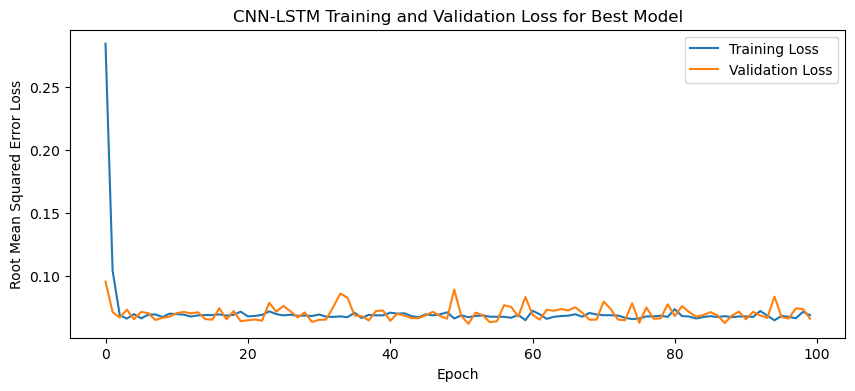

1/1 - 2s - loss: 0.0526 - 2s/epoch - 2s/step
Test Loss: 0.052592143416404724


NameError: name 'make_forecasts' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    #print("Forecasts:")
    #print(forecasts)
    #print("Actual:")
    #print(actual)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

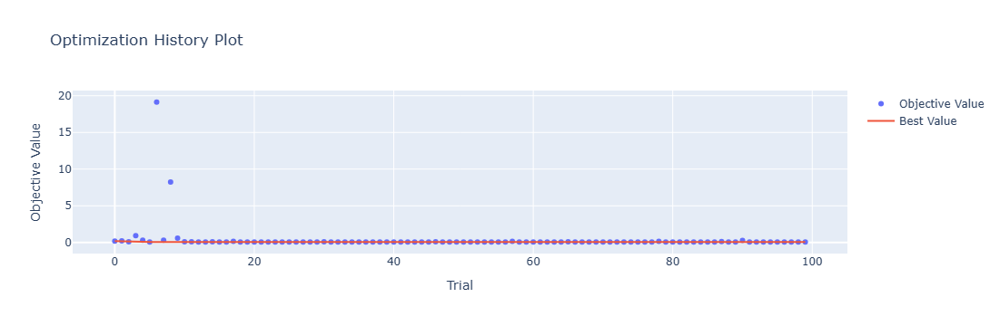

In [4]:
optuna.visualization.plot_optimization_history(study)

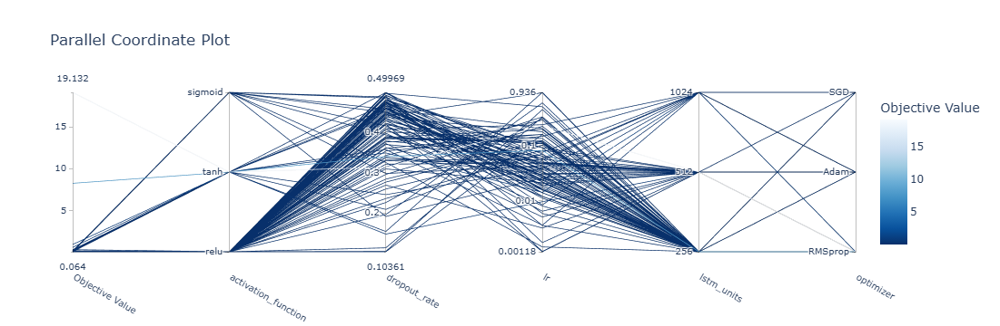

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

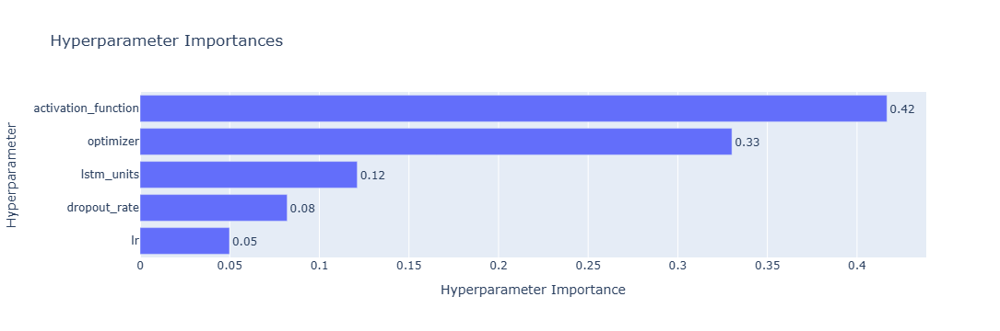

In [6]:
optuna.visualization.plot_param_importances(study)

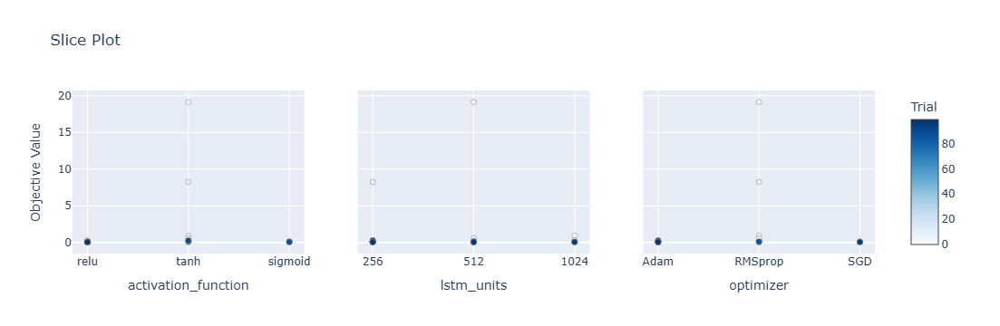

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

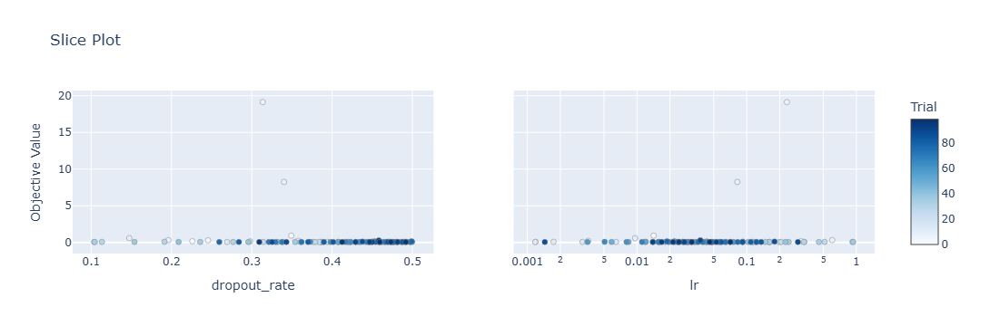

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 6s 30ms/step - loss: 0.3101 - accuracy: 0.4286 - mae: 0.2684 - rmse: 0.3101 - mape: 46.7979 - pearson: 0.4783 - val_loss: 0.1494 - val_accuracy: 0.6000 - val_mae: 0.1363 - val_rmse: 0.1494 - val_mape: 22.2860 - val_pearson: 0.8017
Epoch 2/100
84/84 [==============================] - 1s 14ms/step - loss: 0.1036 - accuracy: 0.7024 - mae: 0.0867 - rmse: 0.1036 - mape: 15.0306 - pearson: 0.7546 - val_loss: 0.0774 - val_accuracy: 0.6000 - val_mae: 0.0642 - val_rmse: 0.0774 - val_mape: 10.8163 - val_pearson: 0.7885
Epoch 3/100
84/84 [==============================] - 1s 13ms/step - loss: 0.0861 - accuracy: 0.7500 - mae: 0.0710 - rmse: 0.0861 - mape: 12.4404 - pearson: 0.7675 - val

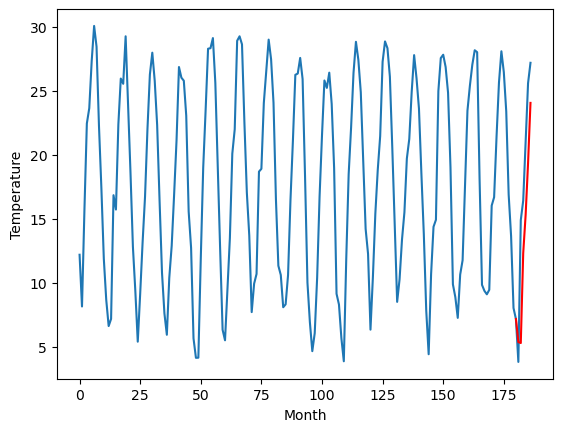

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		12.31		-0.56
12.78		12.24		-0.54
17.84		19.25		1.41
19.24		22.24		3.00
23.26		26.29		3.03
26.74		30.99		4.25
[180, 181, 182, 183, 184, 185, 186]
[13.23, 12.30673972427845, 12.237196049690247, 19.249004921913148, 22.242661318778993, 26.28985818386078, 30.989420733451844]


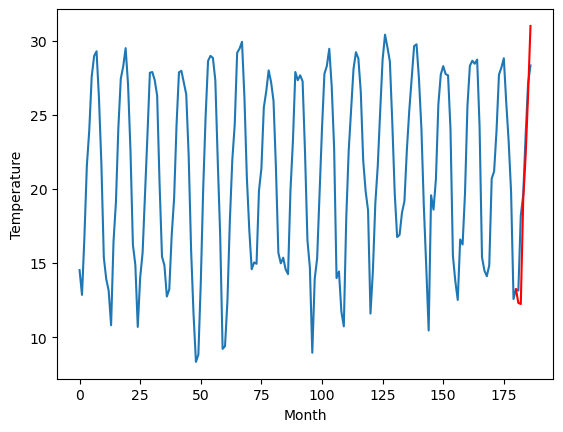

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		14.62		-0.72
16.20		14.55		-1.65
22.18		21.56		-0.62
23.82		24.55		0.73
27.80		28.60		0.80
31.94		33.30		1.36
[180, 181, 182, 183, 184, 185, 186]
[7.18, 14.61673972427845, 14.547196049690246, 21.559004921913147, 24.55266131877899, 28.59985818386078, 33.29942073345184]


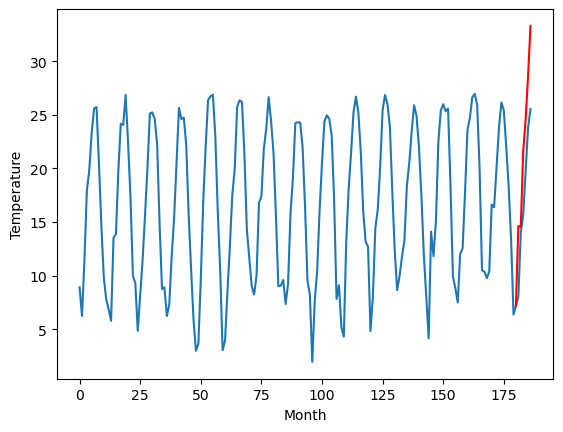

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		9.01		0.01
7.43		8.94		1.51
15.34		15.95		0.61
17.13		18.94		1.81
21.10		22.99		1.89
24.38		27.69		3.31
[180, 181, 182, 183, 184, 185, 186]
[11.46, 9.00673972427845, 8.937196049690247, 15.949004921913147, 18.942661318778992, 22.98985818386078, 27.689420733451843]


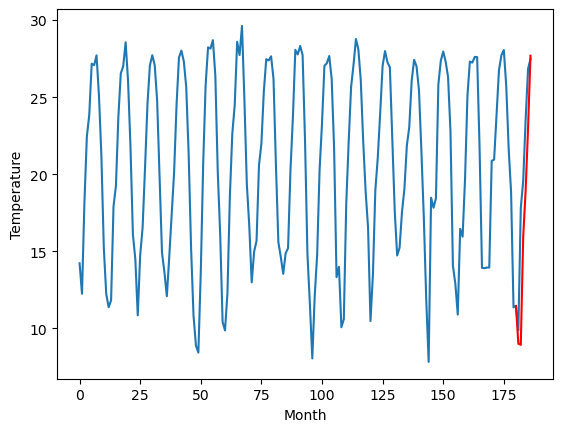

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.33		0.98
10.26		14.26		4.00
20.16		21.27		1.11
22.09		24.26		2.17
25.95		28.31		2.36
31.15		33.01		1.86
[180, 181, 182, 183, 184, 185, 186]
[9.27, 14.32673972427845, 14.257196049690247, 21.269004921913147, 24.262661318778992, 28.30985818386078, 33.00942073345185]


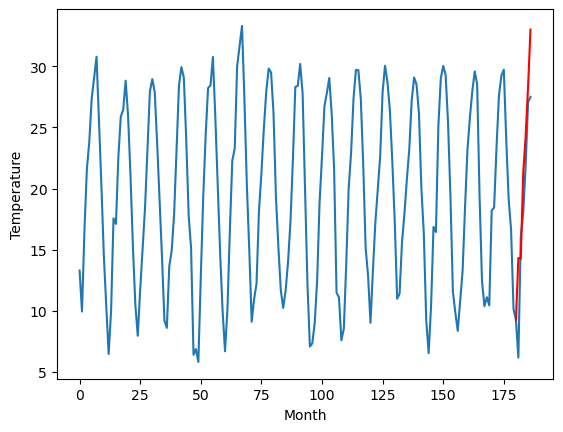

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		13.40		1.88
12.17		13.33		1.16
17.07		20.34		3.27
20.44		23.33		2.89
23.95		27.38		3.43
28.52		32.08		3.56
[180, 181, 182, 183, 184, 185, 186]
[7.77, 13.39673972427845, 13.327196049690247, 20.339004921913148, 23.332661318778992, 27.37985818386078, 32.07942073345184]


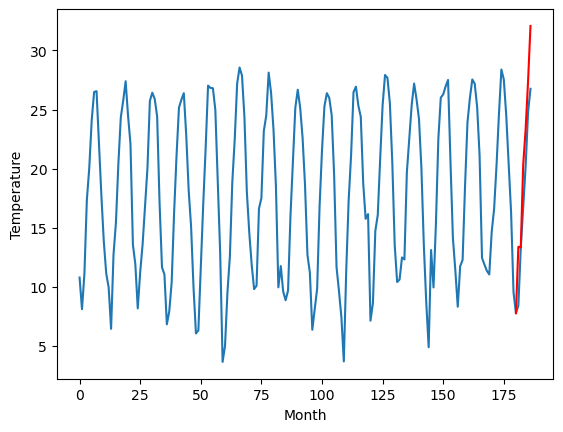

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		10.89		0.68
10.85		10.82		-0.03
17.83		17.83		-0.00
18.86		20.82		1.96
22.57		24.87		2.30
26.90		29.57		2.67
[180, 181, 182, 183, 184, 185, 186]
[6.59, 10.88673972427845, 10.817196049690246, 17.829004921913146, 20.82266131877899, 24.869858183860778, 29.569420733451842]


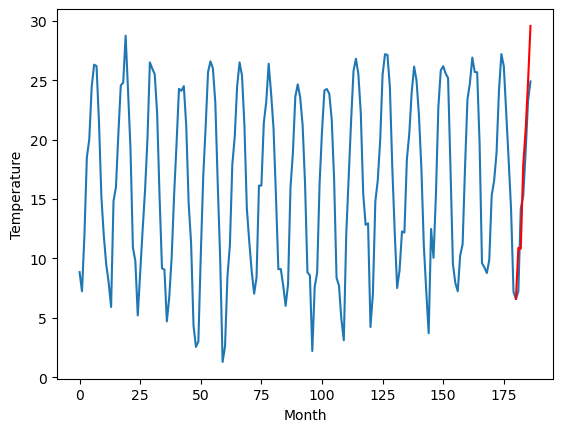

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		8.95		1.04
8.53		8.88		0.35
15.05		15.89		0.84
18.68		18.88		0.20
21.70		22.93		1.23
26.49		27.63		1.14
[180, 181, 182, 183, 184, 185, 186]
[5.3, 8.94673972427845, 8.877196049690246, 15.889004921913147, 18.882661318778993, 22.92985818386078, 27.629420733451845]


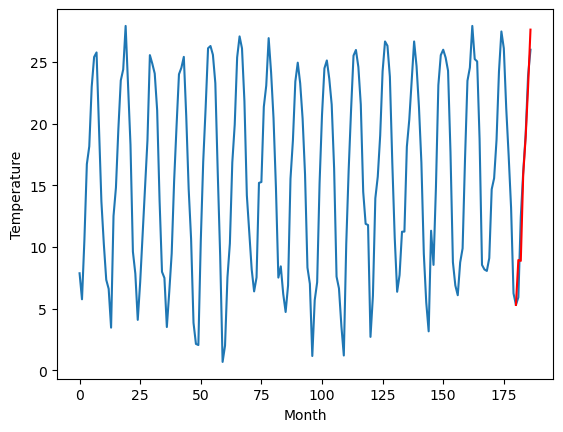

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		7.97		0.89
2.81		7.90		5.09
15.28		14.91		-0.37
17.88		17.90		0.02
22.57		21.95		-0.62
28.76		26.65		-2.11
[180, 181, 182, 183, 184, 185, 186]
[3.1, 7.96673972427845, 7.897196049690247, 14.909004921913148, 17.902661318778993, 21.94985818386078, 26.649420733451844]


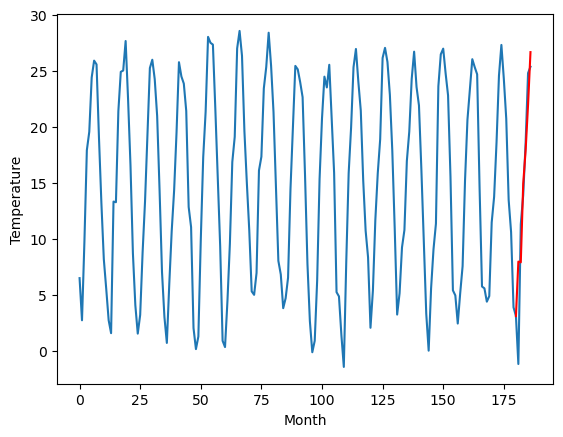

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		6.59		1.69
2.73		6.52		3.79
13.48		13.53		0.05
16.54		16.52		-0.02
21.01		20.57		-0.44
27.49		25.27		-2.22
[180, 181, 182, 183, 184, 185, 186]
[0.6, 6.58673972427845, 6.517196049690247, 13.529004921913147, 16.522661318778994, 20.56985818386078, 25.269420733451845]


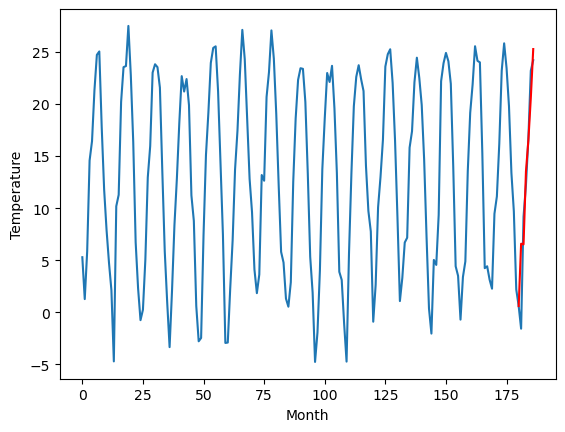

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		5.39		1.71
-0.63		5.32		5.95
11.10		12.33		1.23
15.07		15.32		0.25
20.22		19.37		-0.85
27.53		24.07		-3.46
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 5.38673972427845, 5.317196049690247, 12.329004921913146, 15.32266131877899, 19.369858183860778, 24.069420733451842]


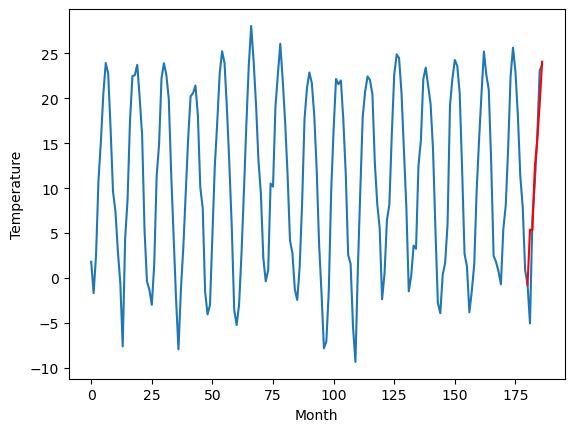

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43    5.38674
1                 1   12.87   12.30674
2                 2   15.34   14.61674
3                 3    9.00    9.00674
4                 4   13.35   14.32674
5                 5   11.52   13.39674
6                 6   10.21   10.88674
7                 7    7.91    8.94674
8                 8    7.08    7.96674
9                 9    4.90    6.58674
10               10    3.68    5.38674


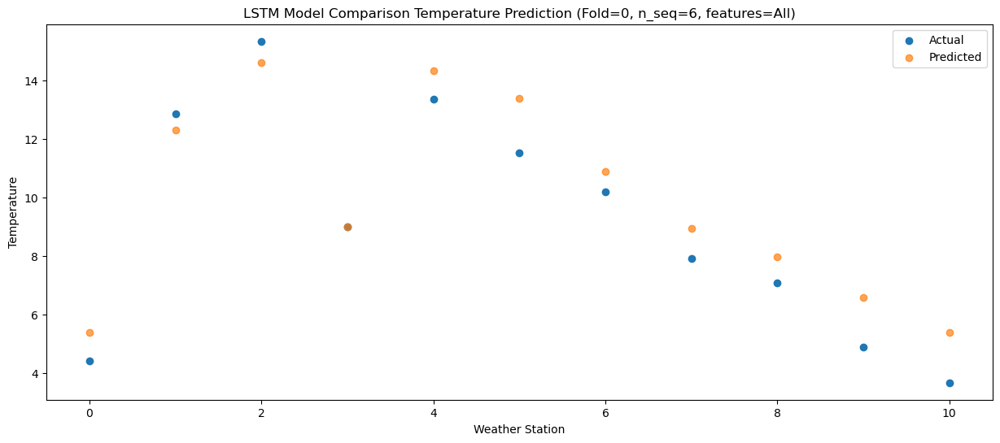

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   5.317196
1                 1   12.78  12.237196
2                 2   16.20  14.547196
3                 3    7.43   8.937196
4                 4   10.26  14.257196
5                 5   12.17  13.327196
6                 6   10.85  10.817196
7                 7    8.53   8.877196
8                 8    2.81   7.897196
9                 9    2.73   6.517196
10               10   -0.63   5.317196


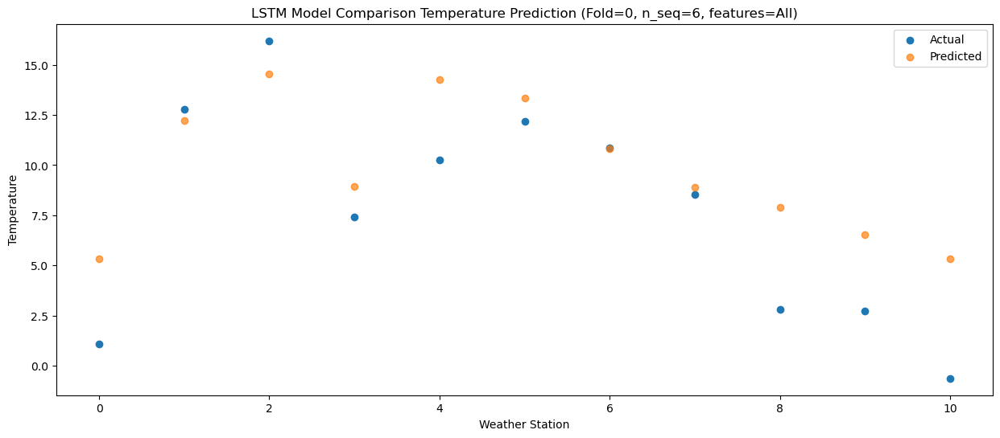

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  12.329005
1                 1   17.84  19.249005
2                 2   22.18  21.559005
3                 3   15.34  15.949005
4                 4   20.16  21.269005
5                 5   17.07  20.339005
6                 6   17.83  17.829005
7                 7   15.05  15.889005
8                 8   15.28  14.909005
9                 9   13.48  13.529005
10               10   11.10  12.329005


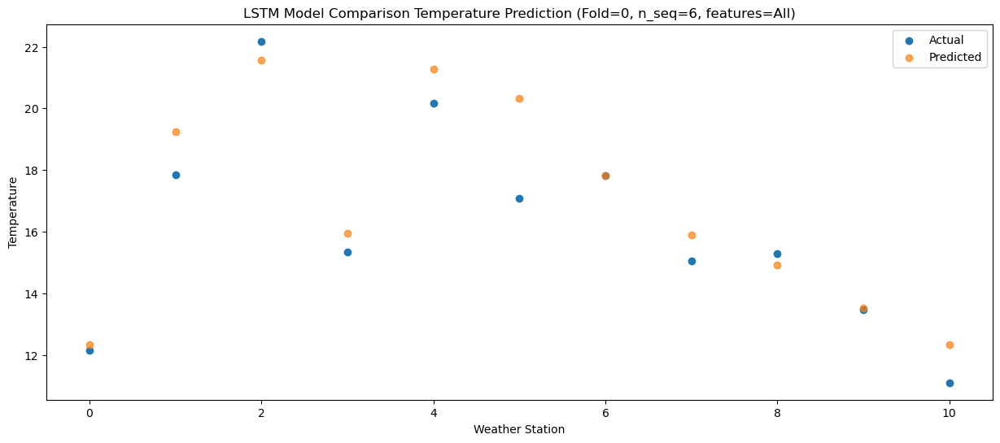

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.322661
1                 1   19.24  22.242661
2                 2   23.82  24.552661
3                 3   17.13  18.942661
4                 4   22.09  24.262661
5                 5   20.44  23.332661
6                 6   18.86  20.822661
7                 7   18.68  18.882661
8                 8   17.88  17.902661
9                 9   16.54  16.522661
10               10   15.07  15.322661


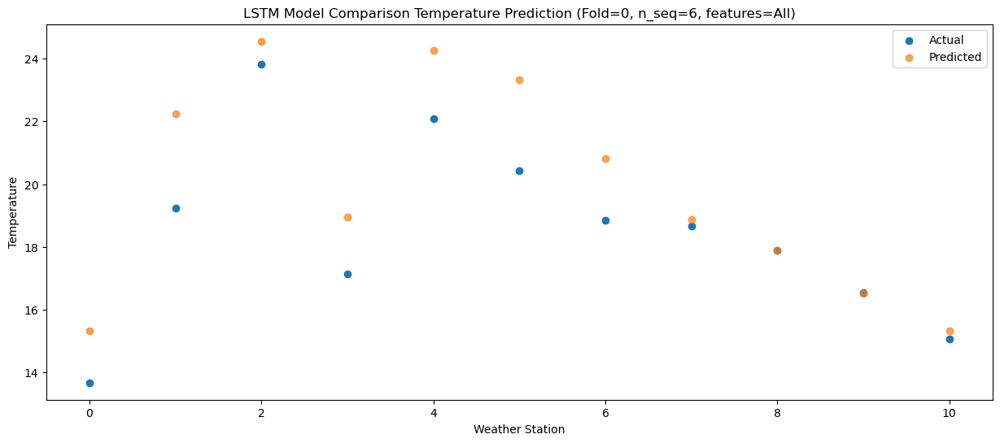

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  19.369858
1                 1   23.26  26.289858
2                 2   27.80  28.599858
3                 3   21.10  22.989858
4                 4   25.95  28.309858
5                 5   23.95  27.379858
6                 6   22.57  24.869858
7                 7   21.70  22.929858
8                 8   22.57  21.949858
9                 9   21.01  20.569858
10               10   20.22  19.369858


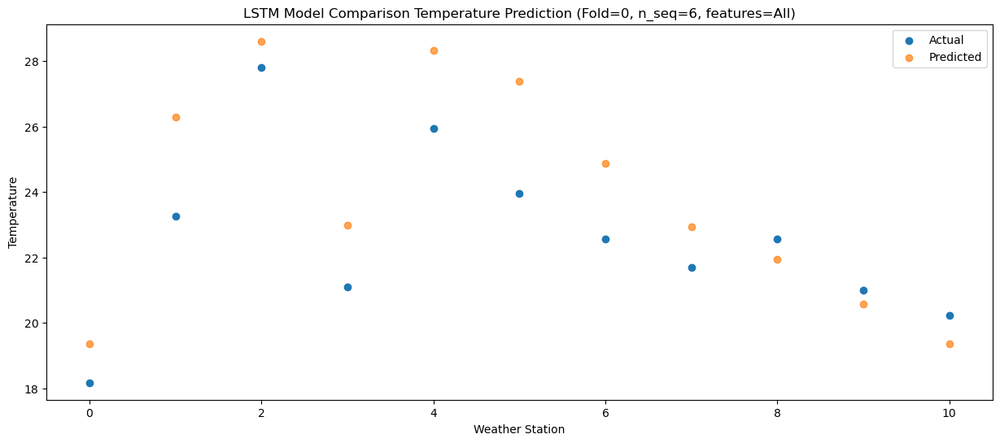

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  24.069421
1                 1   26.74  30.989421
2                 2   31.94  33.299421
3                 3   24.38  27.689421
4                 4   31.15  33.009421
5                 5   28.52  32.079421
6                 6   26.90  29.569421
7                 7   26.49  27.629421
8                 8   28.76  26.649421
9                 9   27.49  25.269421
10               10   27.53  24.069421


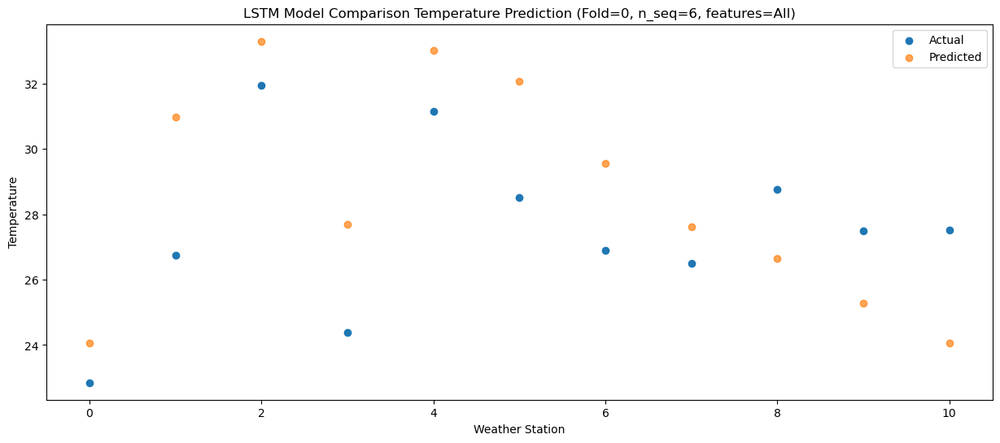

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]]
[[ 5.38673972 12.30673972 14.61673972  9.00673972 14.32673972 13.39673972
  10.88673972  8.94673972  7.96673972  6.58673972  5.38673972]
 [ 5.31719605 12.23719605 14.54719605  8.93719605 14.25719605 13.32719605
  10.81719605  8.87719605  7.89719605  6.51719605  5.31719605]
 [12.32900492 19.24900492 21.55900492 15.94900492 21.26900492 20.33900492
  17.82900492 15.88900492 14.90900492 13.52900492 12.32900492]
 [15.32266132 22.24266132 24.55266132 18.94266132 24.26266132 23.33266132
  20.82266132 18.88266132 17.90266132 16.52266132 15.32266132]
 [19.36985818 26.28985818 28.59

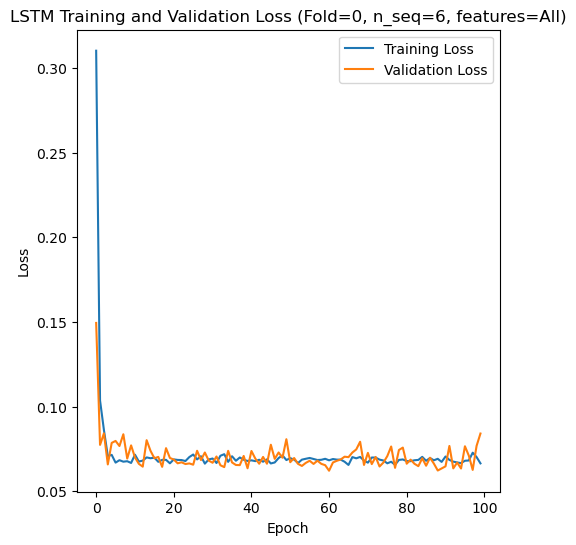

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 32s 126ms/step - loss: 0.2804 - accuracy: 0.4286 - mae: 0.2404 - rmse: 0.2804 - mape: 39.8326 - pearson: 0.4558 - val_loss: 0.0842 - val_accuracy: 0.8000 - val_mae: 0.0672 - val_rmse: 0.0842 - val_mape: 11.7714 - val_pearson: 0.8116
Epoch 2/100
84/84 [==============================] - 4s 48ms/step - loss: 0.1035 - accuracy: 0.6429 - mae: 0.0865 - rmse: 0.1035 - mape: 14.9789 - pearson: 0.7342 - val_loss: 0.0844 - val_accuracy: 0.8000 - val_mae: 0.0720 - val_rmse: 0.0844 - val_mape: 11.8432 - val_pearson: 0.8099
Epoch 3/100
84/84 [==============================] - 5s 55ms/step - loss: 0.0752 - accuracy: 0.7262 - mae: 0.0604 - rmse: 0.0752 - mape: 10.5162 - pearson: 0.7824 - v

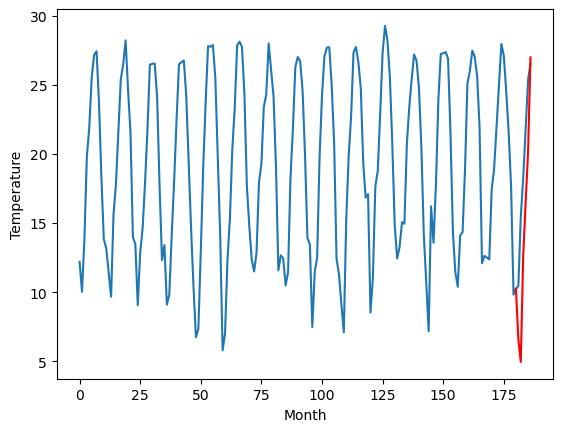

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		10.83		-1.17
12.66		9.19		-3.47
19.43		16.90		-2.53
21.57		20.73		-0.84
25.30		24.37		-0.93
29.44		31.23		1.79
[180, 181, 182, 183, 184, 185, 186]
[6.41, 10.831367206573486, 9.193753790855407, 16.898763251304626, 20.73144061565399, 24.37462909221649, 31.22634561061859]


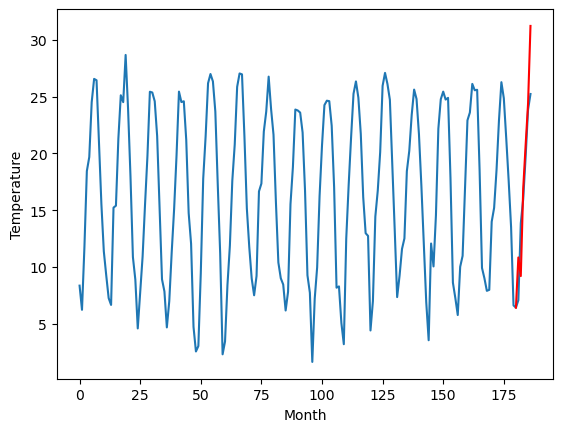

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		6.98		-1.79
9.26		5.34		-3.92
16.32		13.05		-3.27
17.72		16.88		-0.84
21.84		20.52		-1.32
25.72		27.38		1.66
[180, 181, 182, 183, 184, 185, 186]
[7.6, 6.981367206573486, 5.343753790855407, 13.048763251304626, 16.881440615653993, 20.524629092216493, 27.376345610618593]


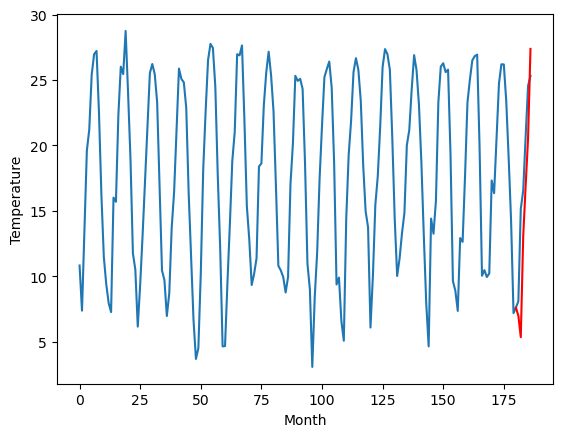

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		9.45		-1.27
9.13		7.81		-1.32
16.50		15.52		-0.98
18.84		19.35		0.51
22.73		22.99		0.26
26.62		29.85		3.23
[180, 181, 182, 183, 184, 185, 186]
[11.89, 9.451367206573487, 7.813753790855408, 15.518763251304627, 19.351440615653992, 22.994629092216492, 29.84634561061859]


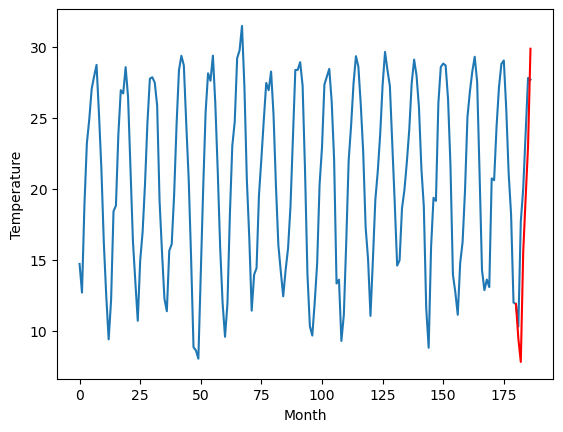

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		13.34		-1.36
13.00		11.70		-1.30
20.61		19.41		-1.20
22.91		23.24		0.33
27.03		26.88		-0.15
30.50		33.74		3.24
[180, 181, 182, 183, 184, 185, 186]
[10.96, 13.341367206573487, 11.703753790855409, 19.408763251304627, 23.241440615653993, 26.884629092216493, 33.73634561061859]


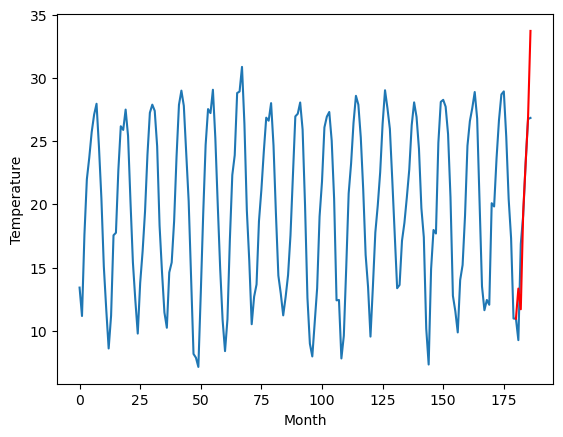

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		12.05		0.14
12.29		10.41		-1.88
19.63		18.12		-1.51
21.90		21.95		0.05
27.49		25.59		-1.90
31.76		32.45		0.69
[180, 181, 182, 183, 184, 185, 186]
[7.75, 12.051367206573486, 10.413753790855408, 18.118763251304628, 21.951440615653993, 25.594629092216493, 32.44634561061859]


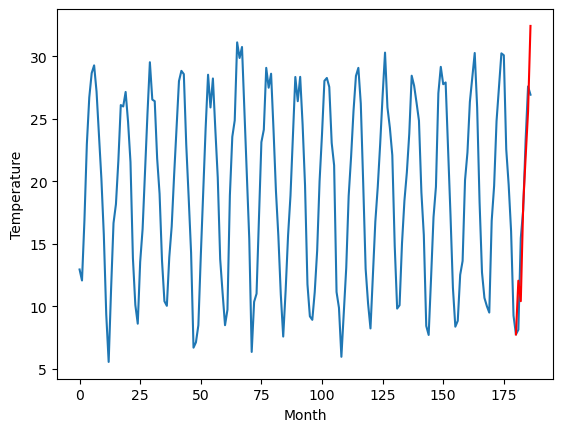

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		11.58		-1.17
13.53		9.94		-3.59
19.81		17.65		-2.16
22.38		21.48		-0.90
26.15		25.12		-1.03
30.16		31.98		1.82
[180, 181, 182, 183, 184, 185, 186]
[6.17, 11.581367206573486, 9.943753790855407, 17.648763251304626, 21.48144061565399, 25.12462909221649, 31.97634561061859]


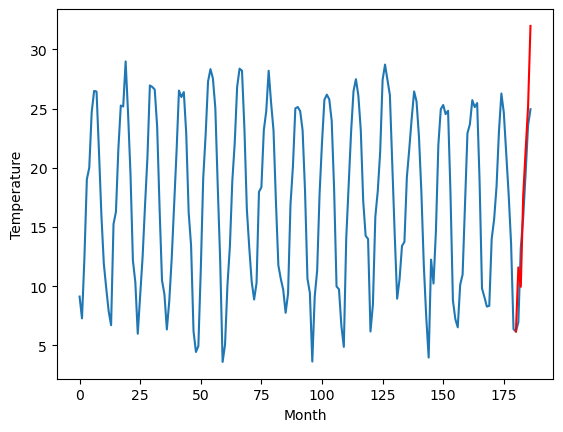

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		7.75		-1.06
5.81		6.11		0.30
17.13		13.82		-3.31
18.84		17.65		-1.19
23.50		21.29		-2.21
29.58		28.15		-1.43
[180, 181, 182, 183, 184, 185, 186]
[4.57, 7.7513672065734855, 6.113753790855407, 13.818763251304626, 17.65144061565399, 21.29462909221649, 28.14634561061859]


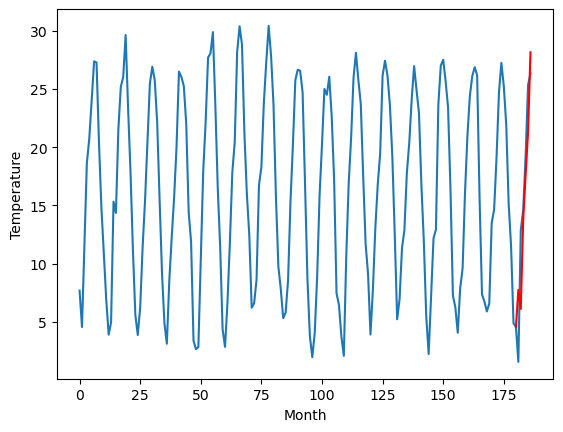

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.32		-1.02
2.56		4.68		2.12
15.12		12.39		-2.73
16.92		16.22		-0.70
21.73		19.86		-1.87
27.76		26.72		-1.04
[180, 181, 182, 183, 184, 185, 186]
[5.46, 6.321367206573487, 4.683753790855408, 12.388763251304628, 16.221440615653993, 19.864629092216493, 26.716345610618593]


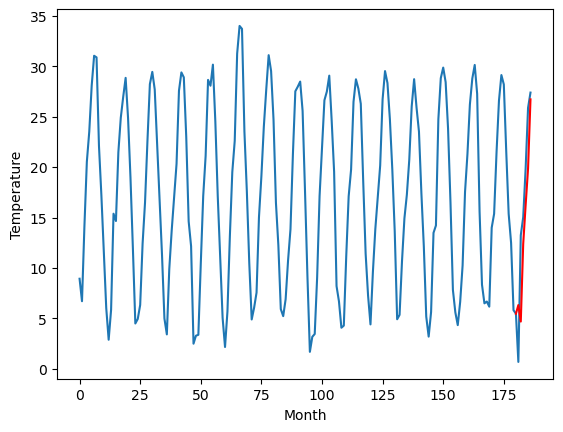

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.56		-1.48
4.67		5.92		1.25
15.38		13.63		-1.75
19.14		17.46		-1.68
23.69		21.10		-2.59
30.80		27.96		-2.84
[180, 181, 182, 183, 184, 185, 186]
[5.42, 7.561367206573486, 5.923753790855407, 13.628763251304626, 17.46144061565399, 21.10462909221649, 27.95634561061859]


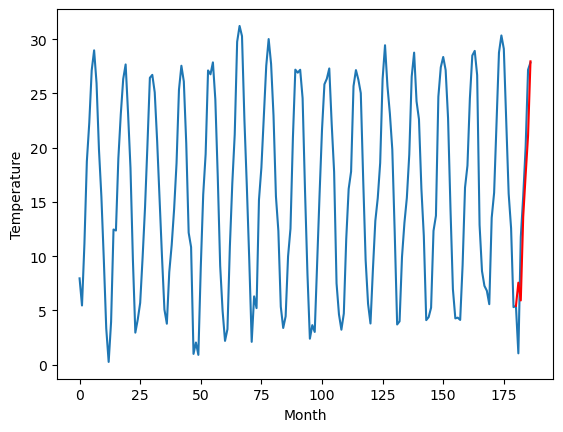

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.59		0.47
5.16		4.95		-0.21
12.38		12.66		0.28
17.03		16.49		-0.54
21.57		20.13		-1.44
27.66		26.99		-0.67
[180, 181, 182, 183, 184, 185, 186]
[2.17, 6.591367206573486, 4.953753790855408, 12.658763251304627, 16.491440615653993, 20.134629092216493, 26.986345610618592]


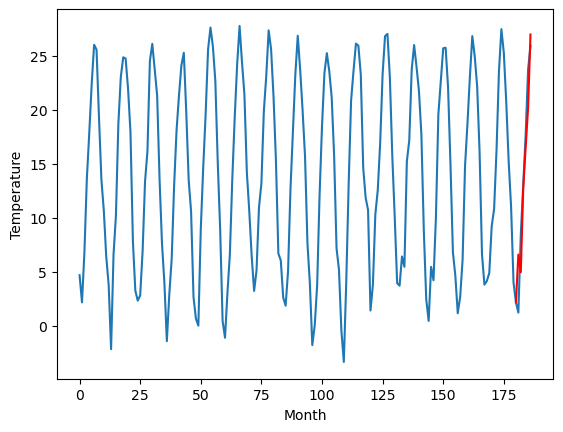

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   6.591367
1                 1   12.00  10.831367
2                 2    8.77   6.981367
3                 3   10.72   9.451367
4                 4   14.70  13.341367
5                 5   11.91  12.051367
6                 6   12.75  11.581367
7                 7    8.81   7.751367
8                 8    7.34   6.321367
9                 9    9.04   7.561367
10               10    6.12   6.591367


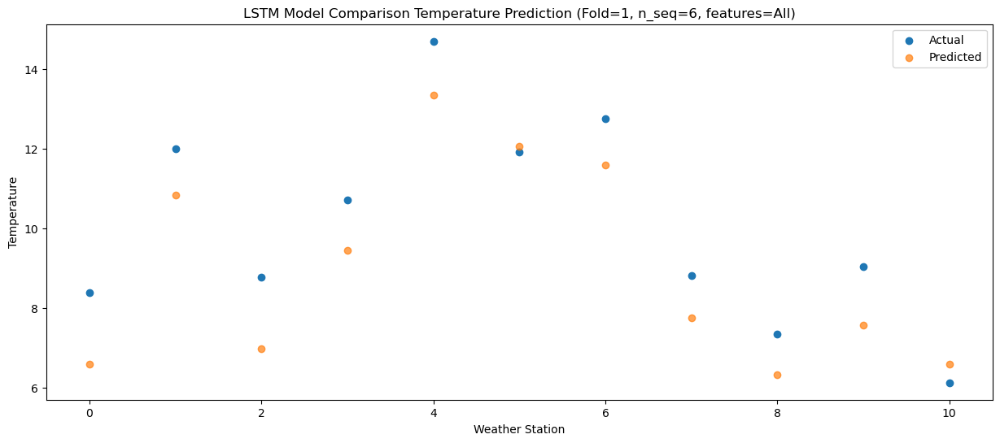

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   4.953754
1                 1   12.66   9.193754
2                 2    9.26   5.343754
3                 3    9.13   7.813754
4                 4   13.00  11.703754
5                 5   12.29  10.413754
6                 6   13.53   9.943754
7                 7    5.81   6.113754
8                 8    2.56   4.683754
9                 9    4.67   5.923754
10               10    5.16   4.953754


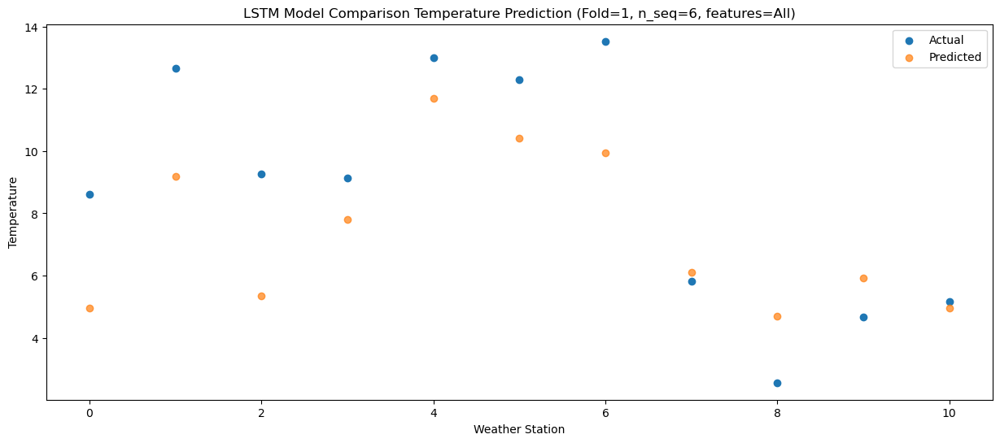

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  12.658763
1                 1   19.43  16.898763
2                 2   16.32  13.048763
3                 3   16.50  15.518763
4                 4   20.61  19.408763
5                 5   19.63  18.118763
6                 6   19.81  17.648763
7                 7   17.13  13.818763
8                 8   15.12  12.388763
9                 9   15.38  13.628763
10               10   12.38  12.658763


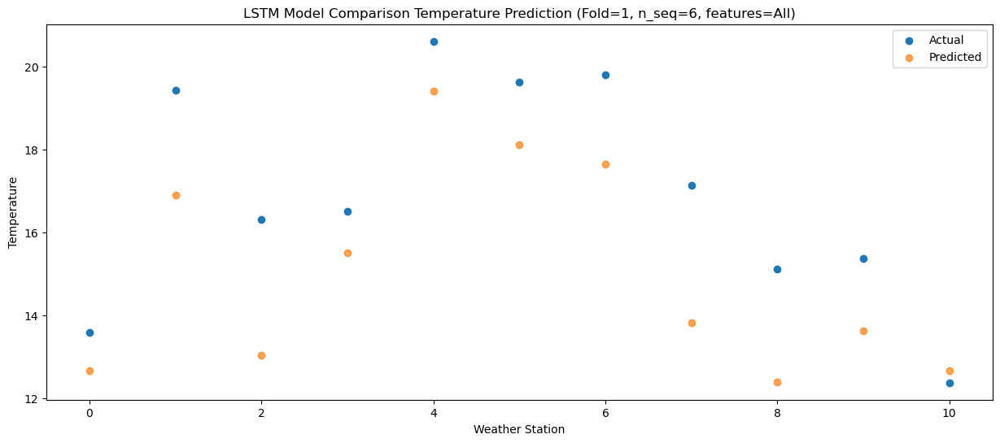

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  16.491441
1                 1   21.57  20.731441
2                 2   17.72  16.881441
3                 3   18.84  19.351441
4                 4   22.91  23.241441
5                 5   21.90  21.951441
6                 6   22.38  21.481441
7                 7   18.84  17.651441
8                 8   16.92  16.221441
9                 9   19.14  17.461441
10               10   17.03  16.491441


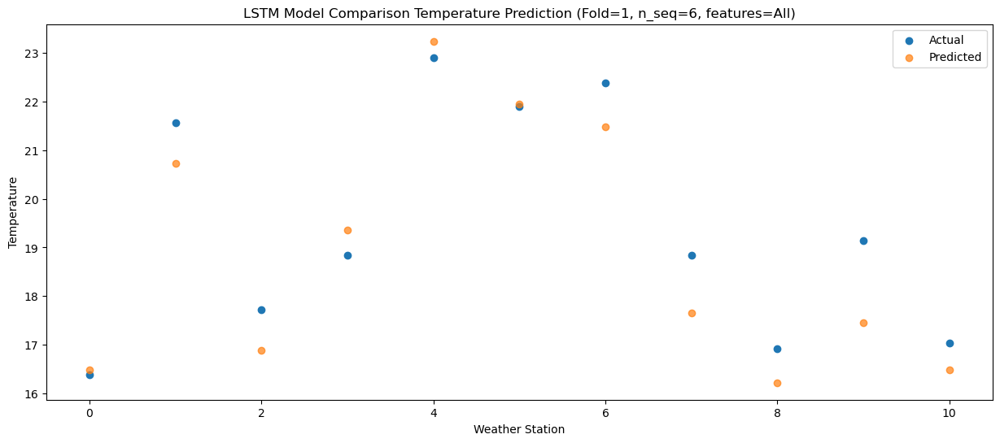

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.134629
1                 1   25.30  24.374629
2                 2   21.84  20.524629
3                 3   22.73  22.994629
4                 4   27.03  26.884629
5                 5   27.49  25.594629
6                 6   26.15  25.124629
7                 7   23.50  21.294629
8                 8   21.73  19.864629
9                 9   23.69  21.104629
10               10   21.57  20.134629


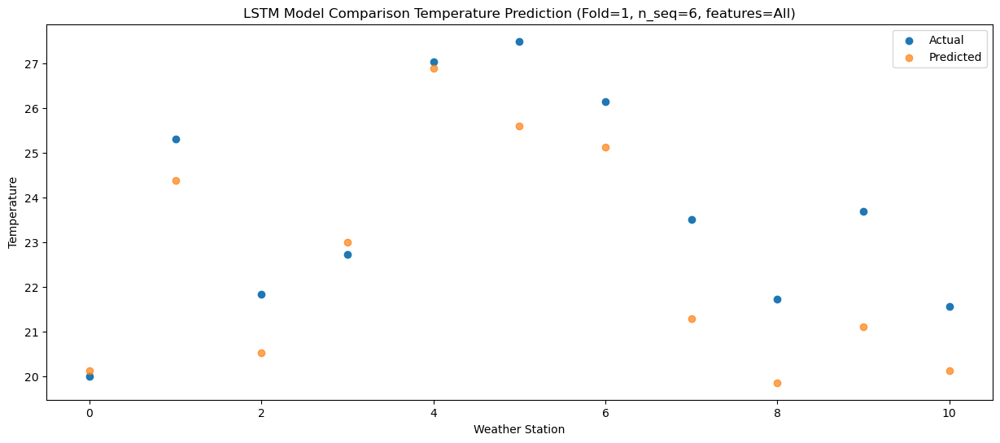

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  26.986346
1                 1   29.44  31.226346
2                 2   25.72  27.376346
3                 3   26.62  29.846346
4                 4   30.50  33.736346
5                 5   31.76  32.446346
6                 6   30.16  31.976346
7                 7   29.58  28.146346
8                 8   27.76  26.716346
9                 9   30.80  27.956346
10               10   27.66  26.986346


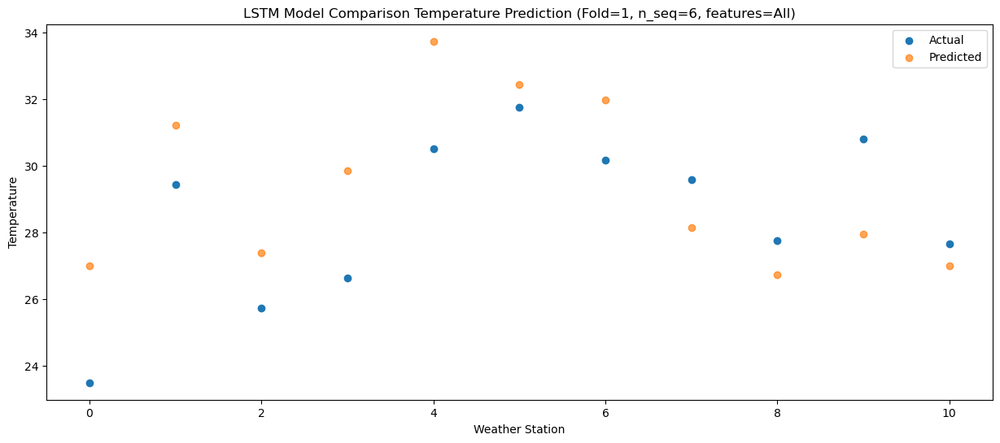

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]]
[[ 6.59136721 10.83136721  6.98136721  9.45136721 13.34136721 12.05136721
  11.58136721  7.75136721  6.32136721  7.56136721  6.59136721]
 [ 4.95375379  9.19375379  5.34375379  7.81375379 11.70375379 10.41375379
   9.94375379  6.11375379  4.68375379  5.92375379  4.95375379]
 [12.65876325 16.89876325 13.04876325 15.51876325 19.40876325 18.11876325
  17.64876325 13.81876325 12.38876325 13.62876325 12.65876325]
 [16.49144062 20.73144062 16.88144062 19.35144062 23.24144062 21.95144062
  21.48144062 17.65144062 16.22144062 17.46144062 16.49144062]
 [20.13462909 24.37462909 20.52

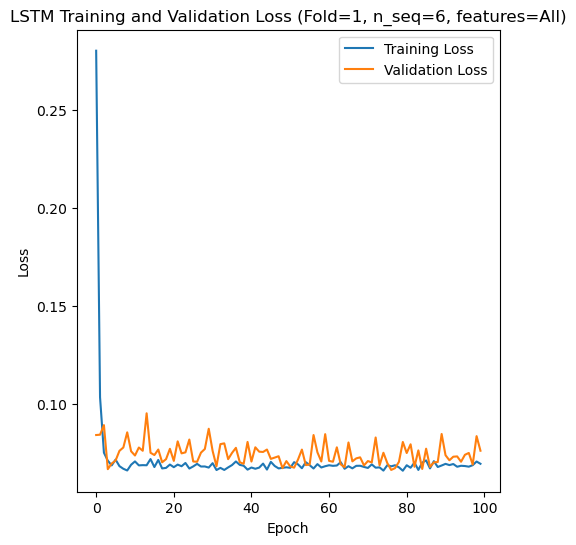

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 16s 85ms/step - loss: 0.3454 - accuracy: 0.4167 - mae: 0.3022 - rmse: 0.3454 - mape: 51.5326 - pearson: 0.4676 - val_loss: 0.0951 - val_accuracy: 0.9000 - val_mae: 0.0862 - val_rmse: 0.0951 - val_mape: 15.3938 - val_pearson: 0.6270
Epoch 2/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0971 - accuracy: 0.6786 - mae: 0.0805 - rmse: 0.0971 - mape: 13.8692 - pearson: 0.7278 - val_loss: 0.0418 - val_accuracy: 0.9000 - val_mae: 0.0341 - val_rmse: 0.0418 - val_mape: 5.6919 - val_pearson: 0.9310
Epoch 3/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0723 - accuracy: 0.7619 - mae: 0.0586 - rmse: 0.0723 - mape: 10.2870 - pearson: 0.8128 - val

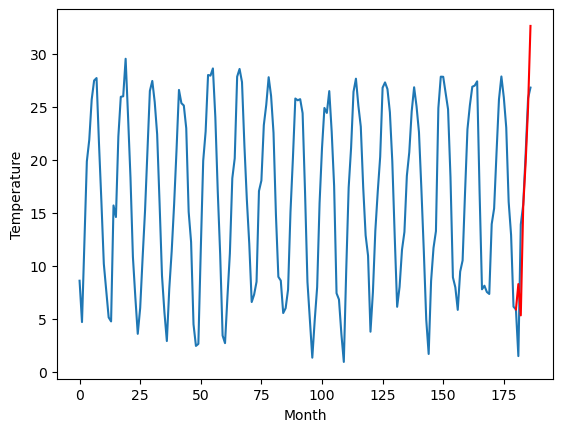

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.33		-0.20
4.49		5.38		0.89
14.68		15.63		0.95
18.44		19.80		1.36
23.62		24.99		1.37
30.87		32.69		1.82
[180, 181, 182, 183, 184, 185, 186]
[2.63, 8.33451815009117, 5.380131915807723, 15.628138736486434, 19.795430854558944, 24.989724830389022, 32.68842621207237]


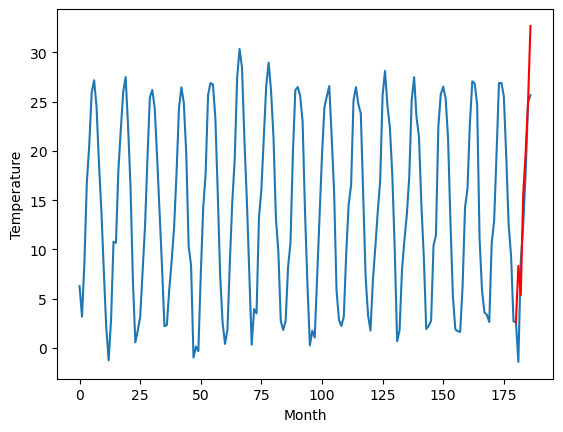

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		6.00		-0.94
9.67		3.05		-6.62
11.48		13.30		1.82
13.29		17.47		4.18
16.87		22.66		5.79
18.09		30.36		12.27
[180, 181, 182, 183, 184, 185, 186]
[16.55, 6.0045181500911715, 3.0501319158077242, 13.298138736486436, 17.465430854558946, 22.659724830389024, 30.358426212072374]


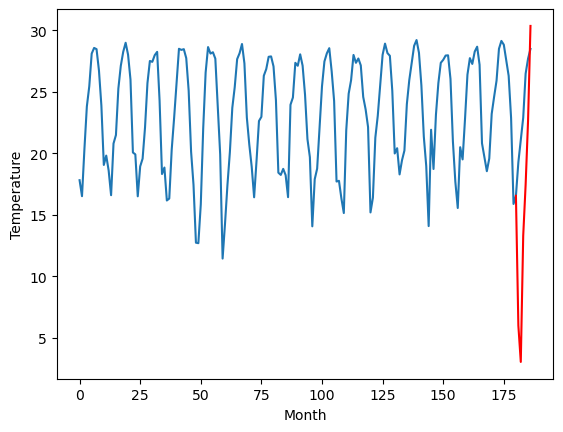

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		17.54		2.80
14.76		14.59		-0.17
18.87		24.84		5.97
23.37		29.01		5.64
28.63		34.20		5.57
34.20		41.90		7.70
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 17.54451815009117, 14.590131915807724, 24.838138736486435, 29.005430854558945, 34.19972483038902, 41.89842621207237]


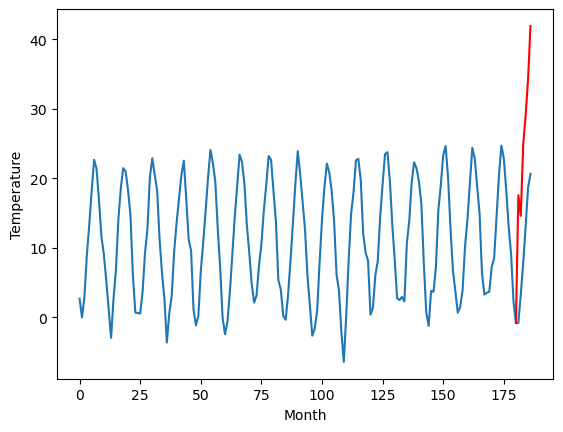

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		2.40		-0.63
2.29		-0.55		-2.84
9.62		9.70		0.08
10.49		13.87		3.38
14.96		19.06		4.10
18.44		26.76		8.32
[180, 181, 182, 183, 184, 185, 186]
[11.52, 2.4045181500911714, -0.5498680841922758, 9.698138736486435, 13.865430854558944, 19.059724830389023, 26.758426212072372]


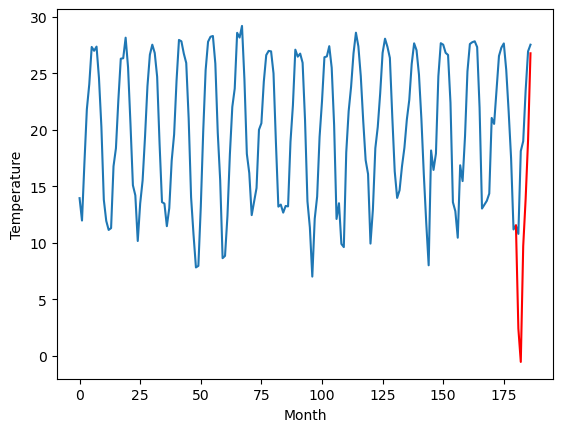

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.66		0.31
11.00		10.71		-0.29
19.38		20.96		1.58
21.50		25.13		3.63
25.54		30.32		4.78
30.09		38.02		7.93
[180, 181, 182, 183, 184, 185, 186]
[11.47, 13.66451815009117, 10.710131915807724, 20.958138736486433, 25.125430854558942, 30.31972483038902, 38.01842621207237]


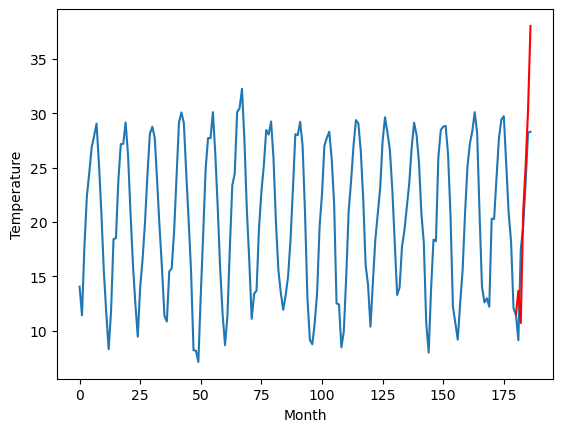

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.77		0.42
10.24		10.82		0.58
20.61		21.07		0.46
22.31		25.24		2.93
26.39		30.43		4.04
31.95		38.13		6.18
[180, 181, 182, 183, 184, 185, 186]
[7.75, 13.774518150091172, 10.820131915807725, 21.068138736486436, 25.235430854558945, 30.429724830389024, 38.12842621207237]


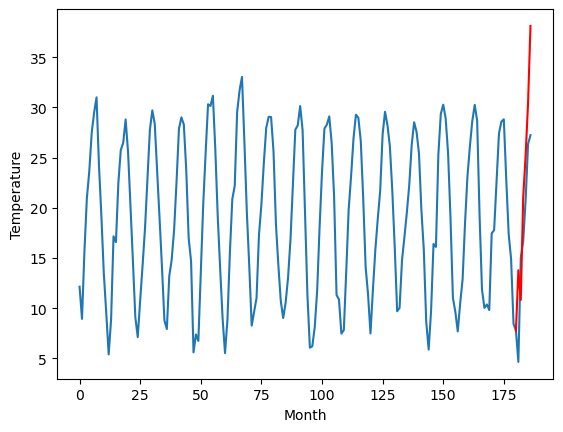

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		11.86		-0.82
15.60		8.91		-6.69
18.70		19.16		0.46
25.36		23.33		-2.03
30.37		28.52		-1.85
35.36		36.22		0.86
[180, 181, 182, 183, 184, 185, 186]
[4.9, 11.864518150091172, 8.910131915807725, 19.158138736486436, 23.325430854558945, 28.519724830389023, 36.21842621207237]


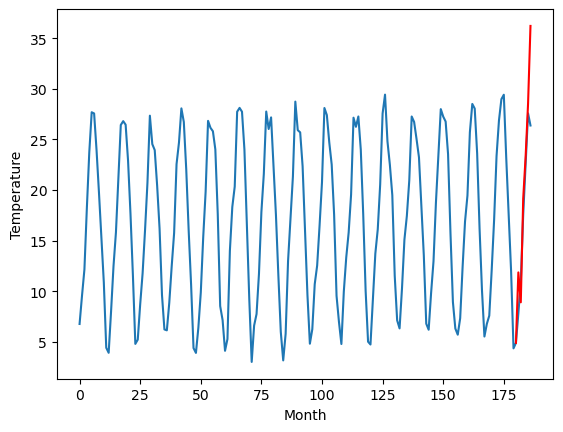

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		6.49		-0.22
5.79		3.54		-2.25
5.39		13.79		8.40
9.25		17.96		8.71
11.47		23.15		11.68
15.71		30.85		15.14
[180, 181, 182, 183, 184, 185, 186]
[14.14, 6.494518150091171, 3.5401319158077236, 13.788138736486435, 17.955430854558944, 23.149724830389022, 30.848426212072372]


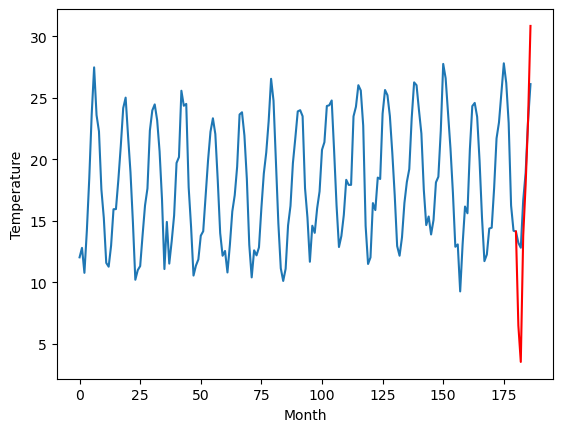

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.76		0.13
12.13		8.81		-3.32
19.01		19.06		0.05
21.80		23.23		1.43
25.82		28.42		2.60
30.11		36.12		6.01
[180, 181, 182, 183, 184, 185, 186]
[5.55, 11.76451815009117, 8.810131915807723, 19.058138736486434, 23.225430854558944, 28.419724830389022, 36.11842621207237]


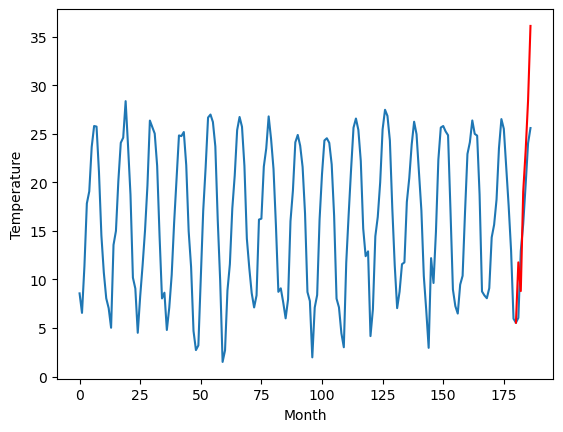

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		8.29		-0.61
10.25		5.34		-4.91
16.46		15.59		-0.87
18.43		19.76		1.33
23.34		24.95		1.61
28.75		32.65		3.90
[180, 181, 182, 183, 184, 185, 186]
[3.19, 8.294518150091172, 5.340131915807724, 15.588138736486435, 19.755430854558945, 24.949724830389023, 32.64842621207237]


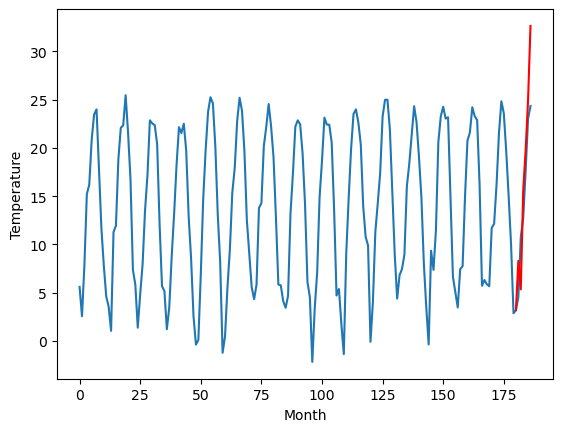

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   8.294518
1                 1    8.53   8.334518
2                 2    6.94   6.004518
3                 3   14.74  17.544518
4                 4    3.03   2.404518
5                 5   13.35  13.664518
6                 6   13.35  13.774518
7                 7   12.68  11.864518
8                 8    6.71   6.494518
9                 9   11.63  11.764518
10               10    8.90   8.294518


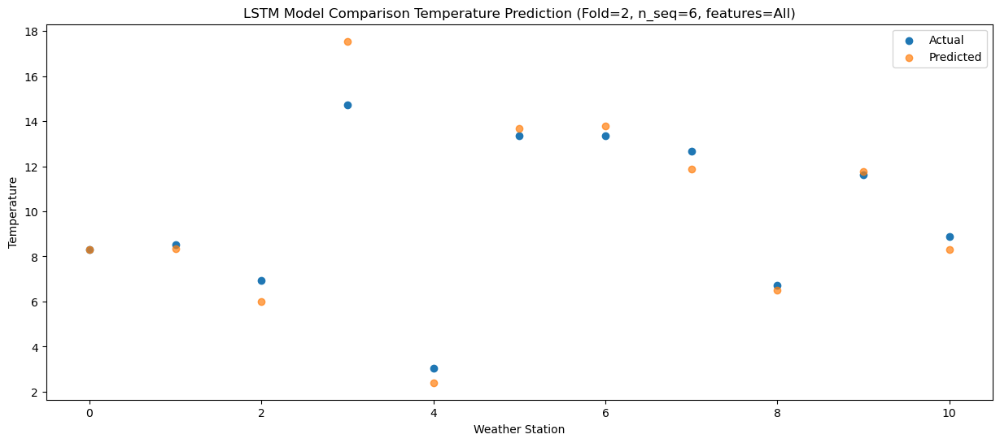

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   5.340132
1                 1    4.49   5.380132
2                 2    9.67   3.050132
3                 3   14.76  14.590132
4                 4    2.29  -0.549868
5                 5   11.00  10.710132
6                 6   10.24  10.820132
7                 7   15.60   8.910132
8                 8    5.79   3.540132
9                 9   12.13   8.810132
10               10   10.25   5.340132


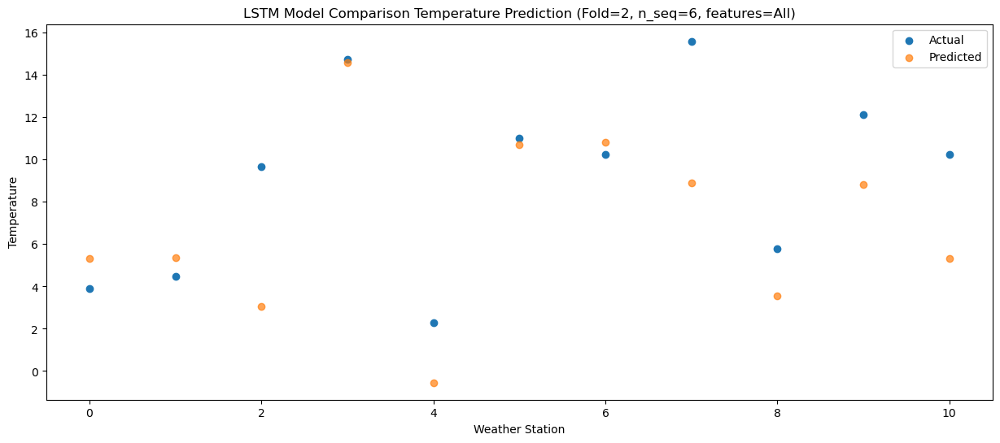

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  15.588139
1                 1   14.68  15.628139
2                 2   11.48  13.298139
3                 3   18.87  24.838139
4                 4    9.62   9.698139
5                 5   19.38  20.958139
6                 6   20.61  21.068139
7                 7   18.70  19.158139
8                 8    5.39  13.788139
9                 9   19.01  19.058139
10               10   16.46  15.588139


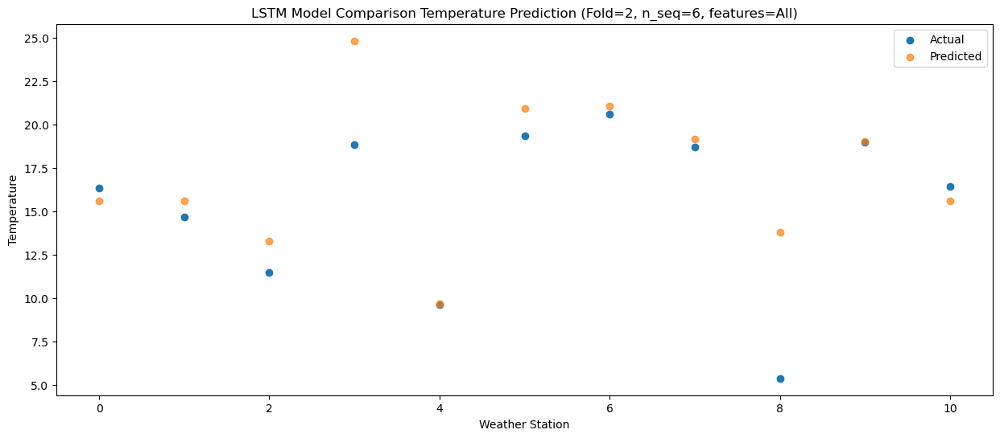

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  19.755431
1                 1   18.44  19.795431
2                 2   13.29  17.465431
3                 3   23.37  29.005431
4                 4   10.49  13.865431
5                 5   21.50  25.125431
6                 6   22.31  25.235431
7                 7   25.36  23.325431
8                 8    9.25  17.955431
9                 9   21.80  23.225431
10               10   18.43  19.755431


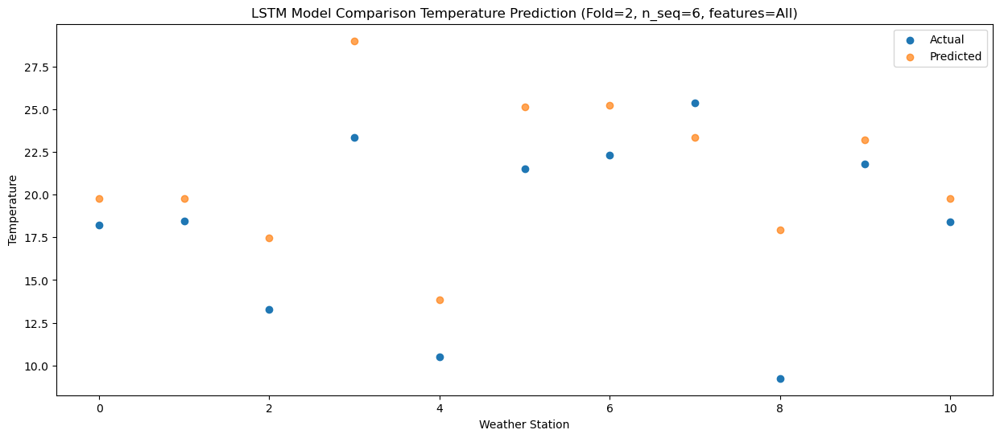

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  24.949725
1                 1   23.62  24.989725
2                 2   16.87  22.659725
3                 3   28.63  34.199725
4                 4   14.96  19.059725
5                 5   25.54  30.319725
6                 6   26.39  30.429725
7                 7   30.37  28.519725
8                 8   11.47  23.149725
9                 9   25.82  28.419725
10               10   23.34  24.949725


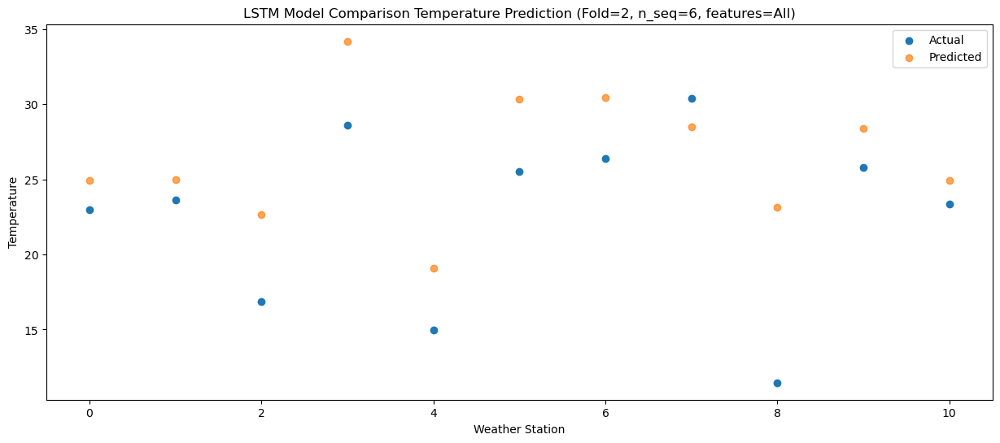

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  32.648426
1                 1   30.87  32.688426
2                 2   18.09  30.358426
3                 3   34.20  41.898426
4                 4   18.44  26.758426
5                 5   30.09  38.018426
6                 6   31.95  38.128426
7                 7   35.36  36.218426
8                 8   15.71  30.848426
9                 9   30.11  36.118426
10               10   28.75  32.648426


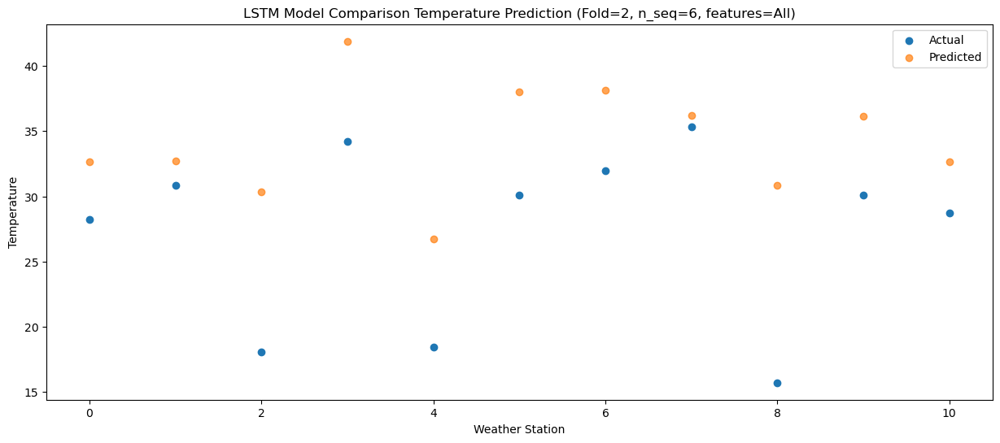

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]]
[[ 8.29451815  8.33451815  6.00451815 17.54451815  2.40451815 13.66451815
  13.77451815 11.86451815  6.49451815 11.76451815  8.29451815]
 [ 5.34013192  5.38013192  3.05013192 14.59013192 -0.54986808 10.71013192
  10.82013192  8.91013192  3.54013192  8.81013192  5.34013192]
 [15.58813874 15.62813874 13.29813874 24.83813874  9.69813874 20.95813874
  21.06813874 19.15813874 13.78813874 19.05813874 15.58813874]
 [19.75543085 19.79543085 17.46543085 29.00543085 13.86543085 25.12543085
  25.23543085 23.32543085 17.95543085 23.22543085 19.75543085]
 [24.94972483 24.98972483 22.65

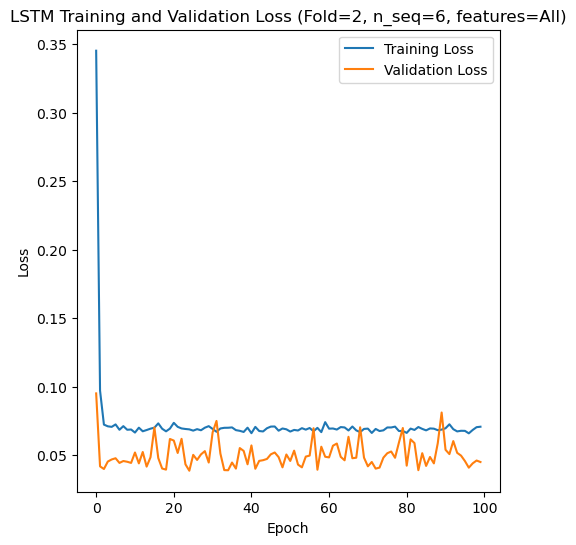

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 33s 121ms/step - loss: 0.3083 - accuracy: 0.5476 - mae: 0.2678 - rmse: 0.3083 - mape: 47.2741 - pearson: 0.4245 - val_loss: 0.0948 - val_accuracy: 0.7000 - val_mae: 0.0758 - val_rmse: 0.0948 - val_mape: 15.0190 - val_pearson: 0.7374
Epoch 2/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0854 - accuracy: 0.7262 - mae: 0.0694 - rmse: 0.0854 - mape: 12.1977 - pearson: 0.7958 - val_loss: 0.1023 - val_accuracy: 0.7000 - val_mae: 0.0836 - val_rmse: 0.1023 - val_mape: 16.6749 - val_pearson: 0.6949
Epoch 3/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0743 - accuracy: 0.7976 - mae: 0.0613 - rmse: 0.0743 - mape: 11.0782 - pearson: 0.8200 - v

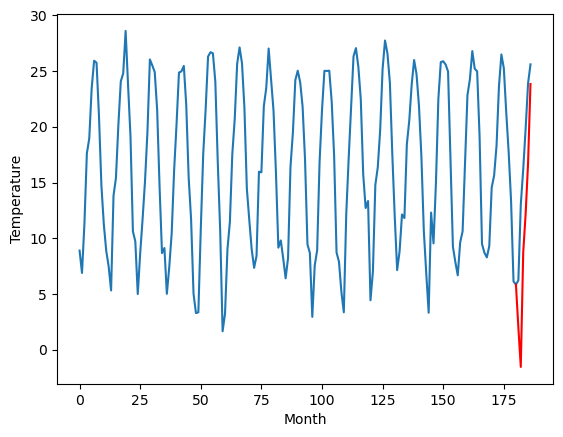

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.69		-0.06
4.03		4.16		0.13
16.00		14.41		-1.59
17.86		17.89		0.03
22.08		22.42		0.34
28.79		29.55		0.76
[180, 181, 182, 183, 184, 185, 186]
[3.2, 7.6946909666061405, 4.159536147117615, 14.410887503623963, 17.892517113685606, 22.422930741310118, 29.545774006843565]


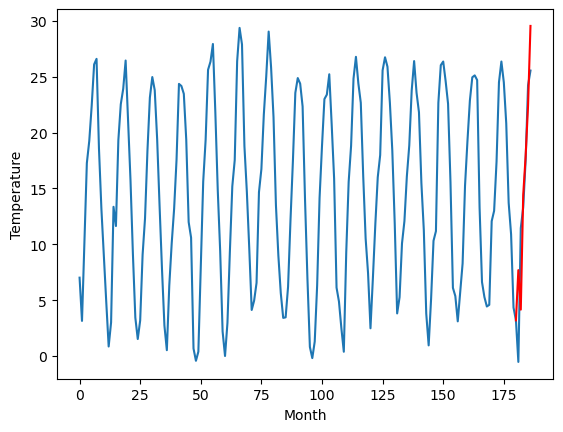

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		5.81		-2.47
10.58		2.28		-8.30
11.73		12.53		0.80
17.46		16.01		-1.45
22.26		20.54		-1.72
27.11		27.67		0.56
[180, 181, 182, 183, 184, 185, 186]
[8.48, 5.81469096660614, 2.2795361471176143, 12.530887503623962, 16.012517113685607, 20.54293074131012, 27.665774006843566]


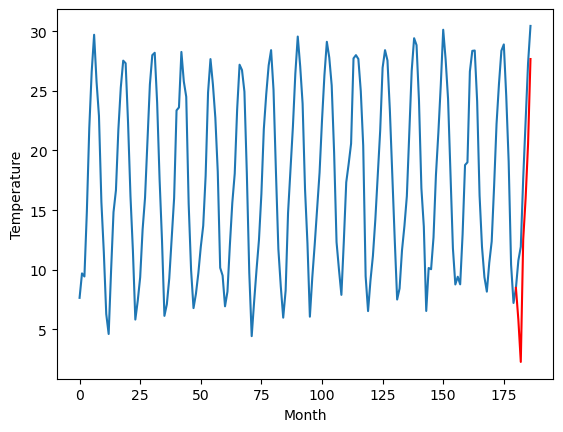

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		6.44		0.25
4.87		2.91		-1.96
15.08		13.16		-1.92
17.43		16.64		-0.79
21.50		21.17		-0.33
27.42		28.30		0.88
[180, 181, 182, 183, 184, 185, 186]
[1.55, 6.4446909666061405, 2.909536147117615, 13.160887503623963, 16.642517113685606, 21.172930741310118, 28.295774006843565]


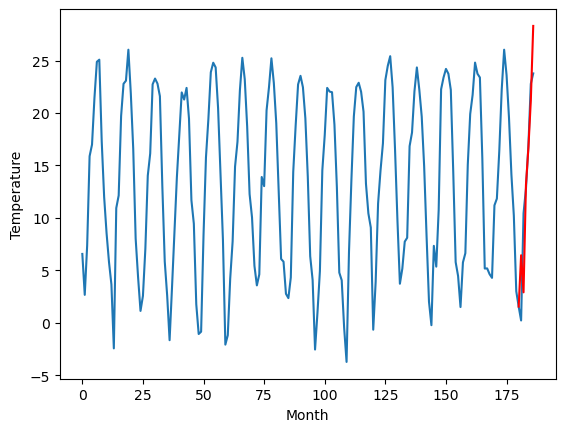

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.36		0.26
1.23		1.83		0.60
14.31		12.08		-2.23
17.60		15.56		-2.04
22.17		20.09		-2.08
29.65		27.22		-2.43
[180, 181, 182, 183, 184, 185, 186]
[1.08, 5.36469096660614, 1.829536147117615, 12.080887503623963, 15.562517113685608, 20.09293074131012, 27.215774006843567]


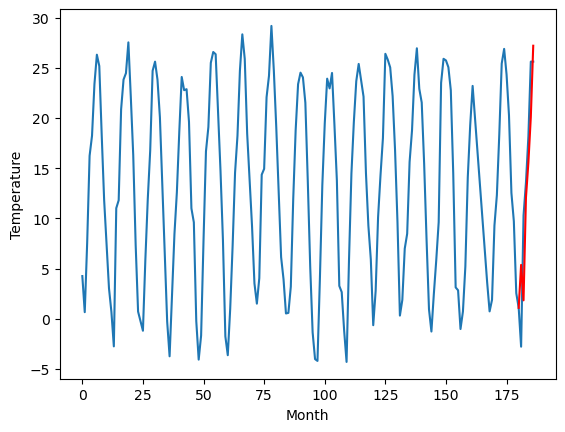

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		3.04		0.24
0.08		-0.49		-0.57
11.41		9.76		-1.65
14.86		13.24		-1.62
19.14		17.77		-1.37
25.85		24.90		-0.95
[180, 181, 182, 183, 184, 185, 186]
[0.21, 3.04469096660614, -0.49046385288238525, 9.760887503623962, 13.242517113685608, 17.77293074131012, 24.895774006843567]


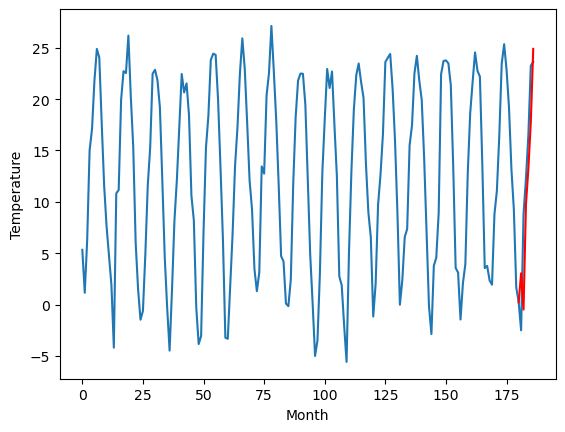

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		4.12		-1.48
5.70		0.59		-5.11
8.67		10.84		2.17
13.45		14.32		0.87
18.50		18.85		0.35
25.89		25.98		0.09
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 4.12469096660614, 0.5895361471176148, 10.840887503623962, 14.322517113685608, 18.852930741310118, 25.975774006843565]


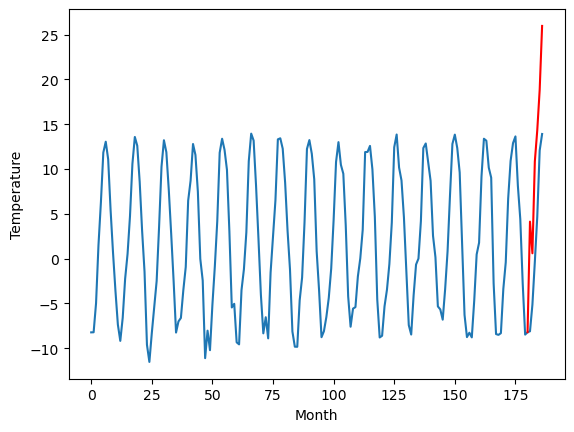

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-9.45		-1.76
-4.84		-12.98		-8.14
-3.24		-2.73		0.51
4.73		0.75		-3.98
9.16		5.28		-3.88
16.80		12.41		-4.39
[180, 181, 182, 183, 184, 185, 186]
[10.04, -9.44530903339386, -12.980463852882385, -2.729112496376038, 0.7525171136856077, 5.282930741310119, 12.405774006843567]


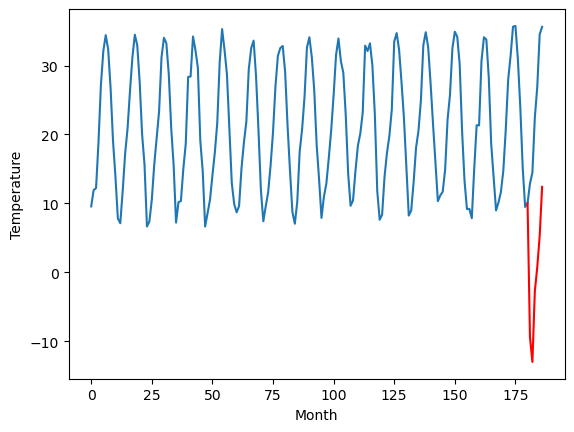

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.36		-2.43
11.72		4.83		-6.89
11.50		15.08		3.58
13.69		18.56		4.87
17.98		23.09		5.11
19.68		30.22		10.54
[180, 181, 182, 183, 184, 185, 186]
[9.17, 8.36469096660614, 4.829536147117615, 15.080887503623963, 18.562517113685608, 23.09293074131012, 30.215774006843567]


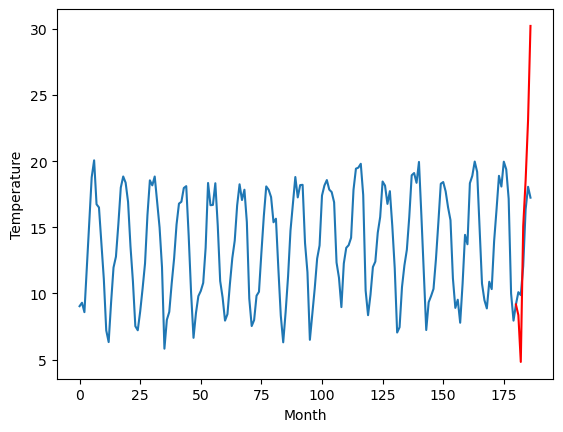

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.83		1.81
5.90		4.30		-1.60
10.90		14.55		3.65
15.52		18.03		2.51
20.35		22.56		2.21
26.22		29.69		3.47
[180, 181, 182, 183, 184, 185, 186]
[0.94, 7.834690966606139, 4.299536147117614, 14.550887503623962, 18.032517113685607, 22.56293074131012, 29.685774006843566]


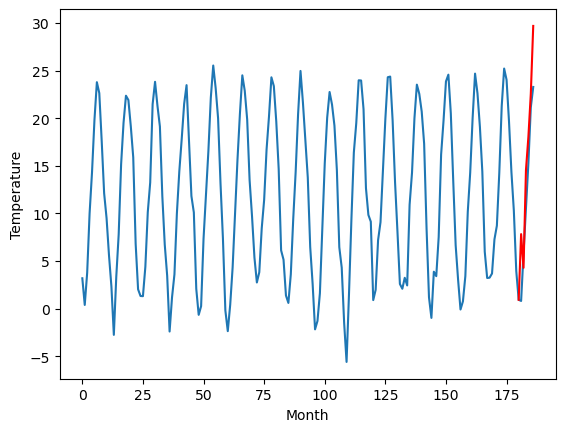

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		1.99		0.35
0.84		-1.54		-2.38
8.03		8.71		0.68
12.90		12.19		-0.71
17.16		16.72		-0.44
23.33		23.85		0.52
[180, 181, 182, 183, 184, 185, 186]
[-0.13, 1.9946909666061403, -1.540463852882385, 8.710887503623962, 12.192517113685607, 16.72293074131012, 23.845774006843566]


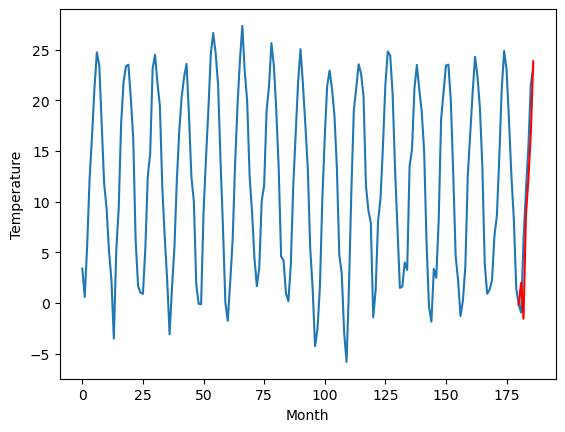

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   1.994691
1                 1    7.75   7.694691
2                 2    8.28   5.814691
3                 3    6.19   6.444691
4                 4    5.10   5.364691
5                 5    2.80   3.044691
6                 6    5.60   4.124691
7                 7   -7.69  -9.445309
8                 8   10.79   8.364691
9                 9    6.02   7.834691
10               10    1.64   1.994691


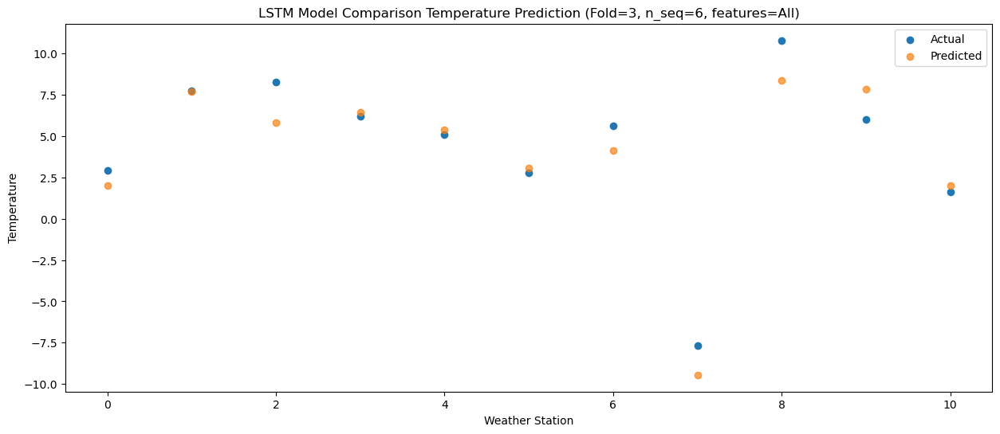

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29  -1.540464
1                 1    4.03   4.159536
2                 2   10.58   2.279536
3                 3    4.87   2.909536
4                 4    1.23   1.829536
5                 5    0.08  -0.490464
6                 6    5.70   0.589536
7                 7   -4.84 -12.980464
8                 8   11.72   4.829536
9                 9    5.90   4.299536
10               10    0.84  -1.540464


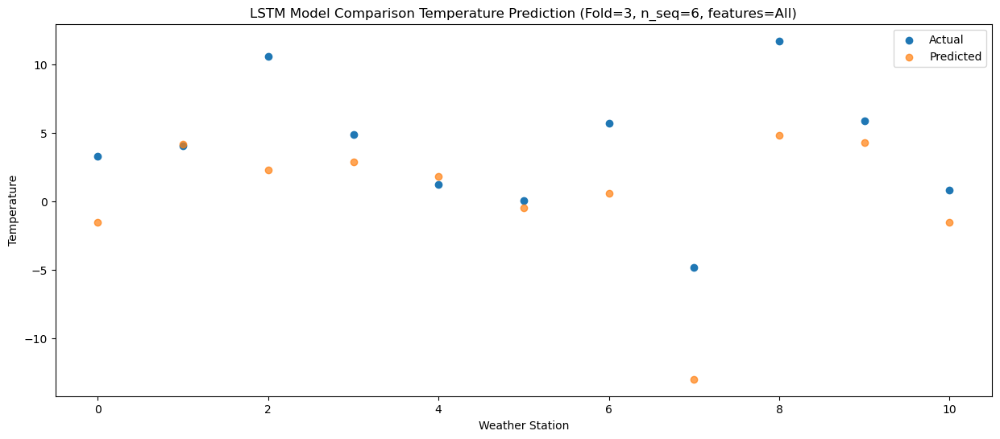

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   8.710888
1                 1   16.00  14.410888
2                 2   11.73  12.530888
3                 3   15.08  13.160888
4                 4   14.31  12.080888
5                 5   11.41   9.760888
6                 6    8.67  10.840888
7                 7   -3.24  -2.729112
8                 8   11.50  15.080888
9                 9   10.90  14.550888
10               10    8.03   8.710888


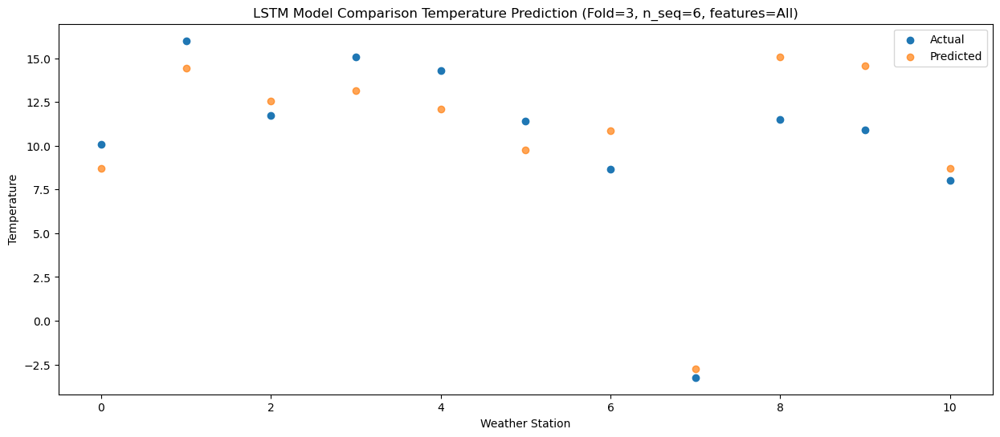

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  12.192517
1                 1   17.86  17.892517
2                 2   17.46  16.012517
3                 3   17.43  16.642517
4                 4   17.60  15.562517
5                 5   14.86  13.242517
6                 6   13.45  14.322517
7                 7    4.73   0.752517
8                 8   13.69  18.562517
9                 9   15.52  18.032517
10               10   12.90  12.192517


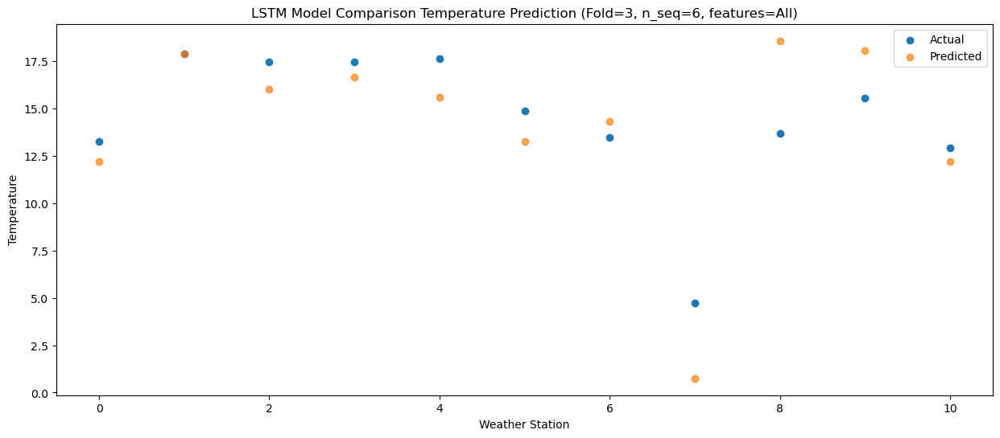

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  16.722931
1                 1   22.08  22.422931
2                 2   22.26  20.542931
3                 3   21.50  21.172931
4                 4   22.17  20.092931
5                 5   19.14  17.772931
6                 6   18.50  18.852931
7                 7    9.16   5.282931
8                 8   17.98  23.092931
9                 9   20.35  22.562931
10               10   17.16  16.722931


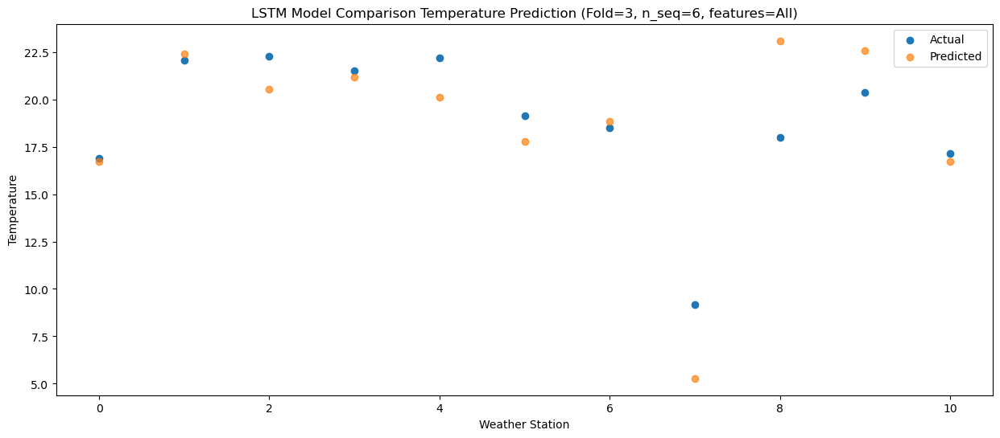

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  23.845774
1                 1   28.79  29.545774
2                 2   27.11  27.665774
3                 3   27.42  28.295774
4                 4   29.65  27.215774
5                 5   25.85  24.895774
6                 6   25.89  25.975774
7                 7   16.80  12.405774
8                 8   19.68  30.215774
9                 9   26.22  29.685774
10               10   23.33  23.845774


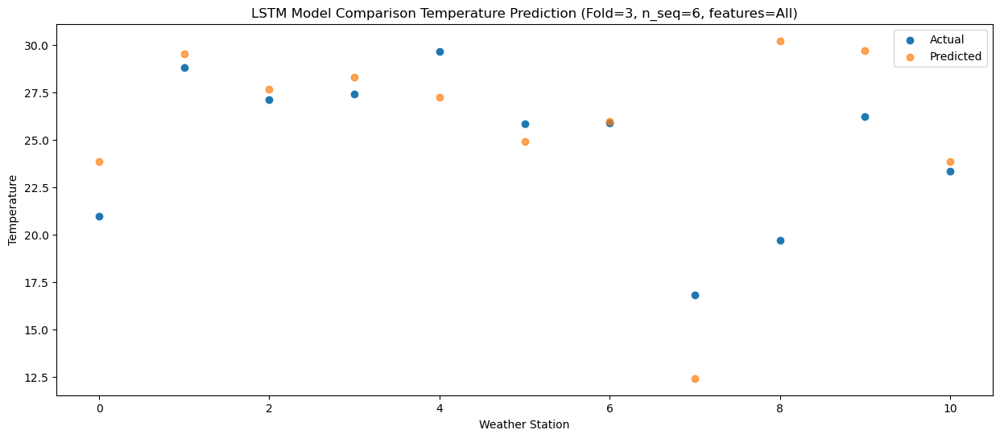

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]]
[[  1.99469097   7.69469097   5.81469097   6.44469097   5.36469097
    3.04469097   4.12469097  -9.44530903   8.36469097   7.83469097
    1.99469097]
 [ -1.54046385   4.15953615   2.27953615   2.90953615   1.82953615
   -0.49046385   0.58953615 -12.98046385   4.82953615   4.29953615
   -1.54046385]
 [  8.7108875   14.4108875   12.5308875   13.1608875   12.0808875
    9.7608875   10.8408875   -2.7291125   15.0808875   14.5508875
    8.7108875 ]
 [ 12.19251711  17.89251711  16.01251711  16.64251711  15.56251711
   13.24251711  14.32251711   0.75251711  18.56251711  18.032517

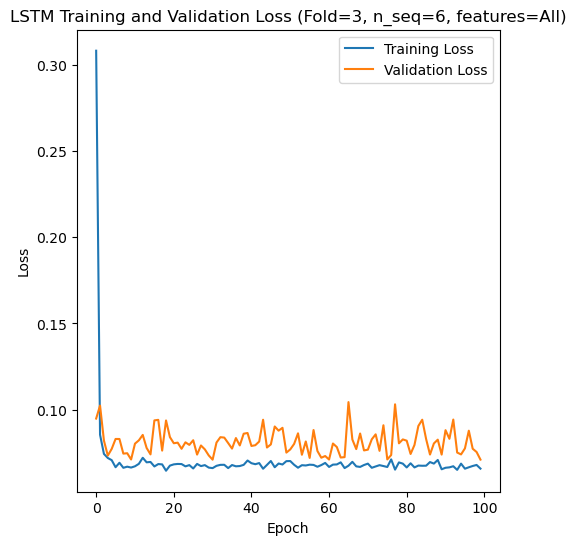

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 32s 118ms/step - loss: 0.2414 - accuracy: 0.4643 - mae: 0.2085 - rmse: 0.2414 - mape: 36.8030 - pearson: 0.4939 - val_loss: 0.1167 - val_accuracy: 0.7000 - val_mae: 0.0979 - val_rmse: 0.1167 - val_mape: 18.2015 - val_pearson: 0.5465
Epoch 2/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0990 - accuracy: 0.6905 - mae: 0.0815 - rmse: 0.0990 - mape: 14.1445 - pearson: 0.7237 - val_loss: 0.0939 - val_accuracy: 0.7000 - val_mae: 0.0781 - val_rmse: 0.0939 - val_mape: 12.7843 - val_pearson: 0.8195
Epoch 3/100
84/84 [==============================] - 4s 49ms/step - loss: 0.0764 - accuracy: 0.7143 - mae: 0.0622 - rmse: 0.0764 - mape: 10.9239 - pearson: 0.7578 - v

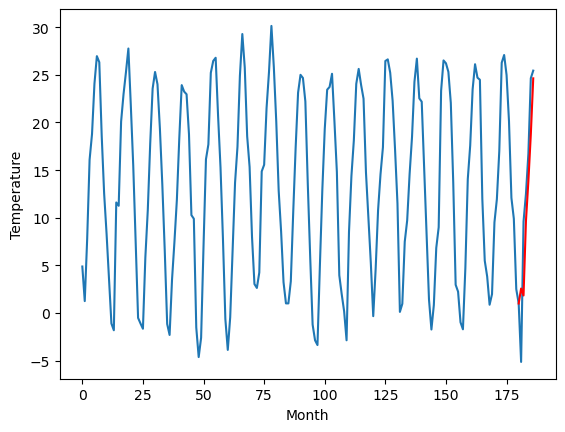

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.85		-1.74
9.02		3.12		-5.90
10.62		10.95		0.33
12.06		15.13		3.07
16.10		20.00		3.90
17.73		25.90		8.17
[180, 181, 182, 183, 184, 185, 186]
[14.25, 3.85094274520874, 3.118007853031158, 10.950743868350983, 15.127162172794343, 20.004900648593903, 25.900569632053376]


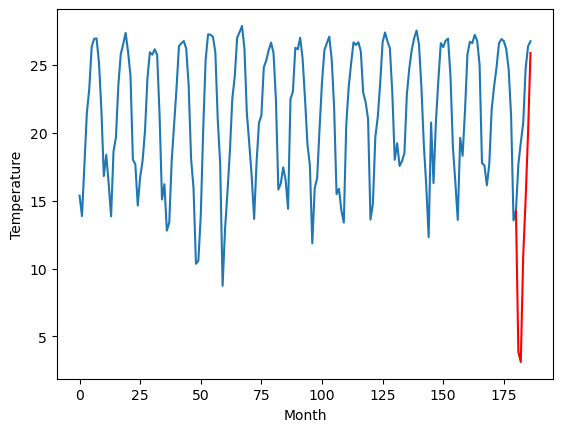

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		14.34		-1.07
13.49		13.61		0.12
22.82		21.44		-1.38
23.89		25.62		1.73
28.36		30.49		2.13
32.62		36.39		3.77
[180, 181, 182, 183, 184, 185, 186]
[9.06, 14.340942745208741, 13.60800785303116, 21.440743868350985, 25.617162172794345, 30.494900648593905, 36.39056963205338]


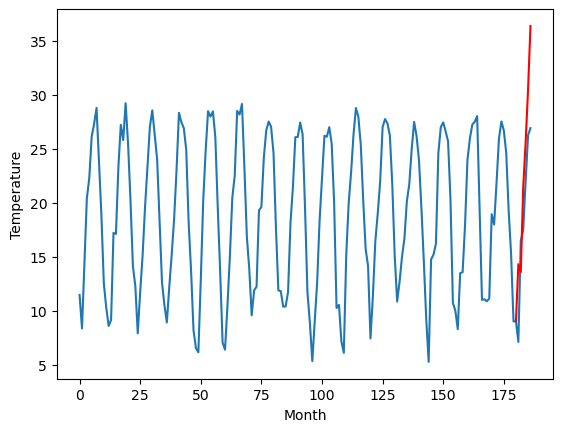

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		10.45		-0.12
7.11		9.72		2.61
18.07		17.55		-0.52
19.76		21.73		1.97
23.92		26.60		2.68
29.60		32.50		2.90
[180, 181, 182, 183, 184, 185, 186]
[7.48, 10.45094274520874, 9.718007853031159, 17.550743868350985, 21.727162172794344, 26.604900648593905, 32.50056963205338]


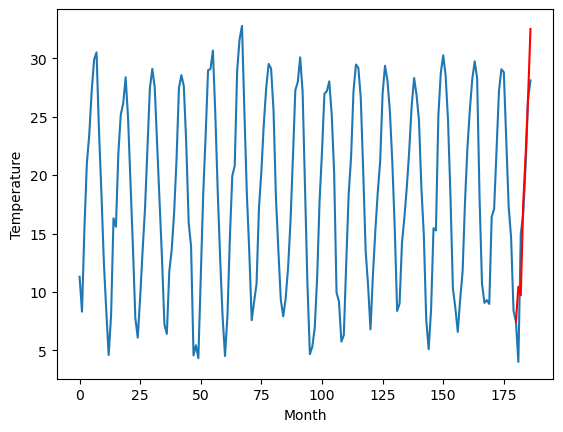

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.27		-0.44
6.82		9.54		2.72
17.74		17.37		-0.37
19.92		21.55		1.63
23.45		26.42		2.97
30.30		32.32		2.02
[180, 181, 182, 183, 184, 185, 186]
[7.33, 10.27094274520874, 9.538007853031159, 17.370743868350985, 21.547162172794344, 26.424900648593905, 32.32056963205338]


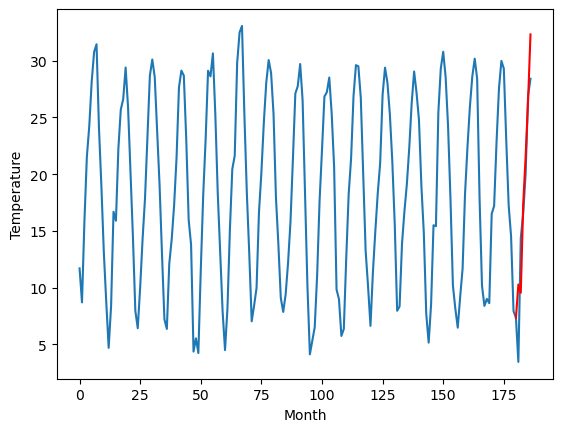

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		10.65		0.06
9.02		9.92		0.90
18.27		17.75		-0.52
20.50		21.93		1.43
25.99		26.80		0.81
30.95		32.70		1.75
[180, 181, 182, 183, 184, 185, 186]
[6.59, 10.65094274520874, 9.918007853031158, 17.75074386835098, 21.92716217279434, 26.8049006485939, 32.70056963205337]


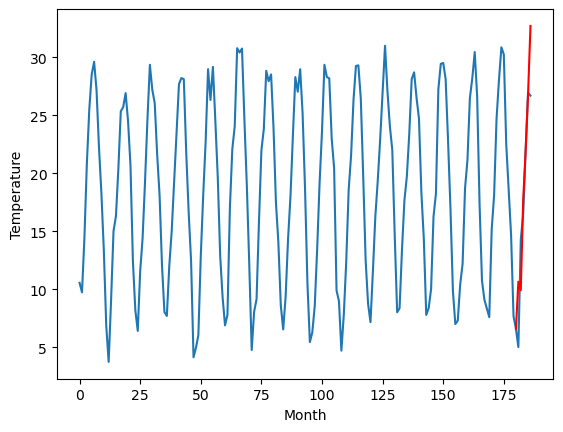

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.52		-1.27
11.46		8.79		-2.67
17.86		16.62		-1.24
20.59		20.80		0.21
24.04		25.67		1.63
28.06		31.57		3.51
[180, 181, 182, 183, 184, 185, 186]
[6.04, 9.52094274520874, 8.788007853031159, 16.620743868350985, 20.797162172794344, 25.674900648593905, 31.570569632053378]


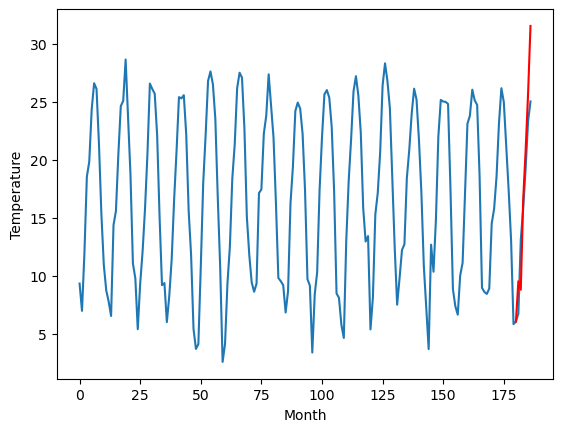

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.28		0.63
4.04		7.55		3.51
16.31		15.38		-0.93
18.21		19.56		1.35
22.25		24.43		2.18
28.55		30.33		1.78
[180, 181, 182, 183, 184, 185, 186]
[3.13, 8.28094274520874, 7.548007853031159, 15.380743868350983, 19.557162172794342, 24.434900648593903, 30.330569632053376]


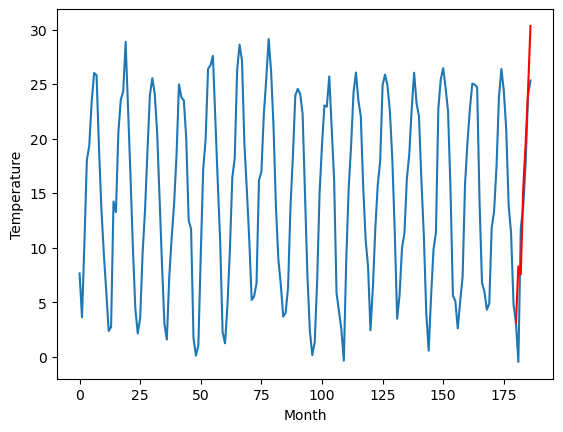

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.60		0.54
2.70		5.87		3.17
14.67		13.70		-0.97
18.32		17.88		-0.44
22.73		22.75		0.02
29.97		28.65		-1.32
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 6.60094274520874, 5.868007853031158, 13.700743868350983, 17.877162172794343, 22.754900648593903, 28.650569632053376]


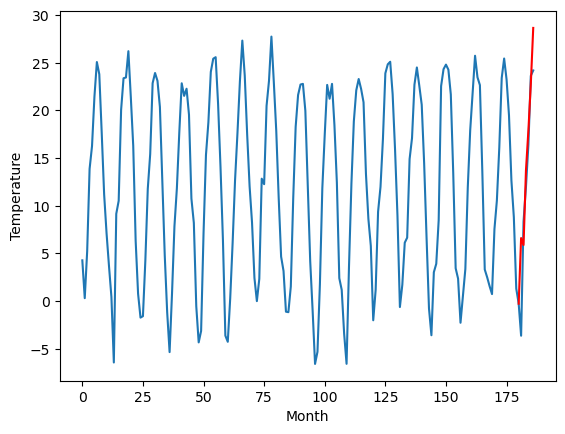

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		3.22		0.99
-2.21		2.49		4.70
11.65		10.32		-1.33
15.36		14.50		-0.86
20.14		19.37		-0.77
27.53		25.27		-2.26
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 3.22094274520874, 2.4880078530311582, 10.320743868350982, 14.497162172794342, 19.3749006485939, 25.270569632053373]


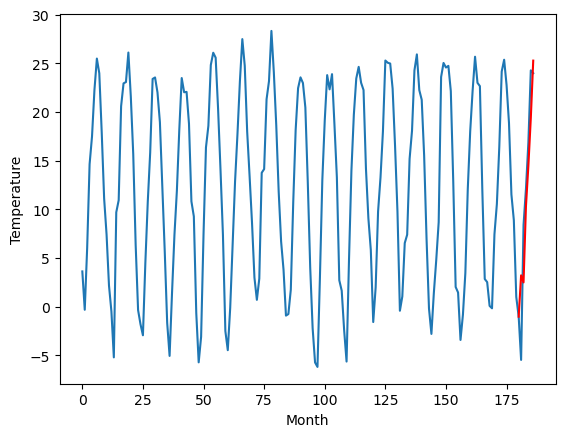

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.58		0.88
-0.54		1.85		2.39
9.35		9.68		0.33
13.15		13.86		0.71
17.68		18.73		1.05
24.57		24.63		0.06
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 2.5809427452087403, 1.8480078530311586, 9.680743868350984, 13.857162172794343, 18.734900648593904, 24.630569632053376]


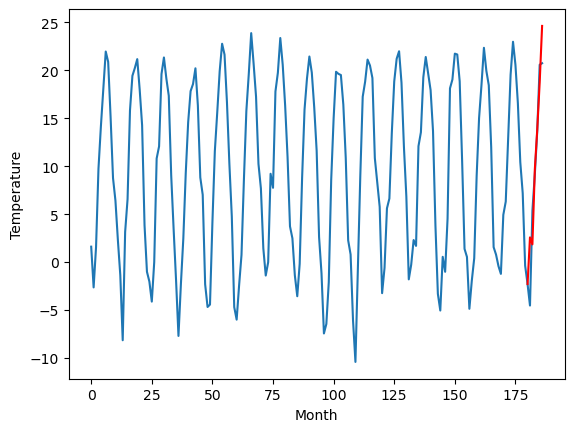

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.580943
1                 1    5.59   3.850943
2                 2   15.41  14.340943
3                 3   10.57  10.450943
4                 4   10.71  10.270943
5                 5   10.59  10.650943
6                 6   10.79   9.520943
7                 7    7.65   8.280943
8                 8    6.06   6.600943
9                 9    2.23   3.220943
10               10    1.70   2.580943


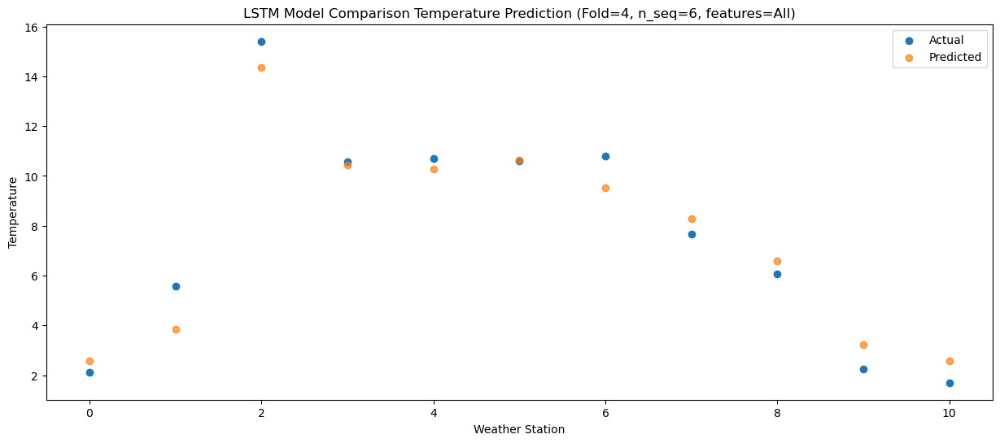

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02   1.848008
1                 1    9.02   3.118008
2                 2   13.49  13.608008
3                 3    7.11   9.718008
4                 4    6.82   9.538008
5                 5    9.02   9.918008
6                 6   11.46   8.788008
7                 7    4.04   7.548008
8                 8    2.70   5.868008
9                 9   -2.21   2.488008
10               10   -0.54   1.848008


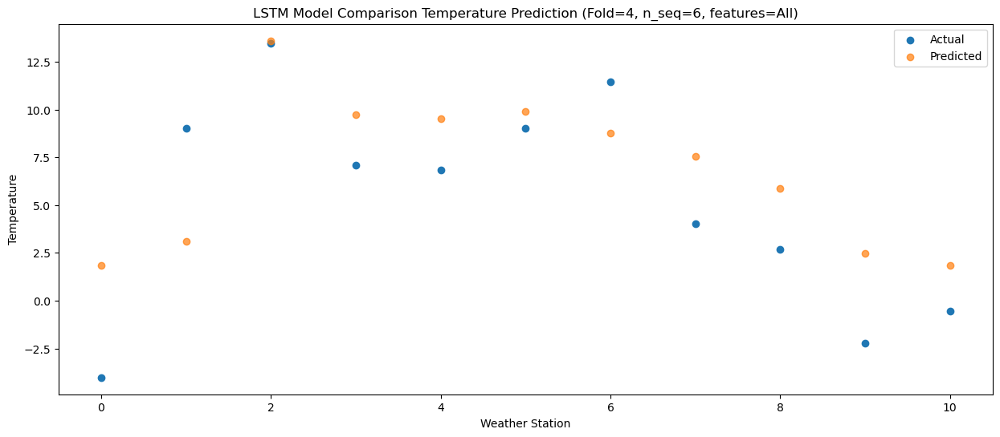

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71   9.680744
1                 1   10.62  10.950744
2                 2   22.82  21.440744
3                 3   18.07  17.550744
4                 4   17.74  17.370744
5                 5   18.27  17.750744
6                 6   17.86  16.620744
7                 7   16.31  15.380744
8                 8   14.67  13.700744
9                 9   11.65  10.320744
10               10    9.35   9.680744


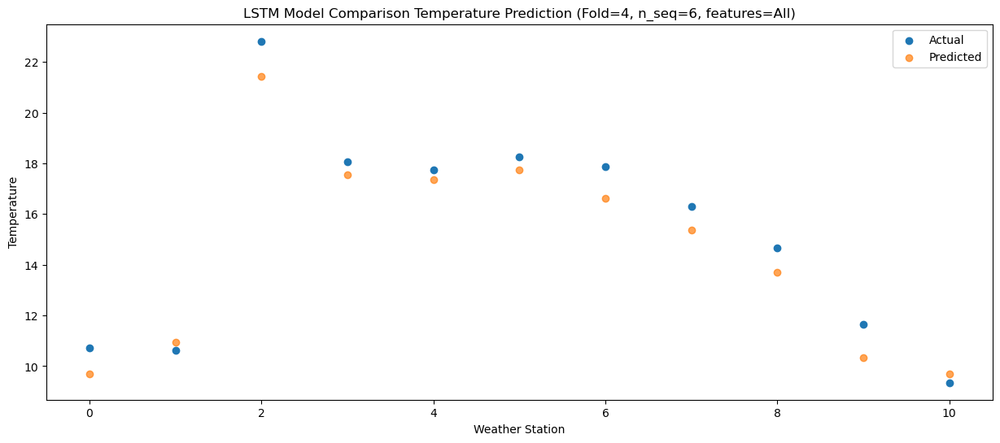

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  13.857162
1                 1   12.06  15.127162
2                 2   23.89  25.617162
3                 3   19.76  21.727162
4                 4   19.92  21.547162
5                 5   20.50  21.927162
6                 6   20.59  20.797162
7                 7   18.21  19.557162
8                 8   18.32  17.877162
9                 9   15.36  14.497162
10               10   13.15  13.857162


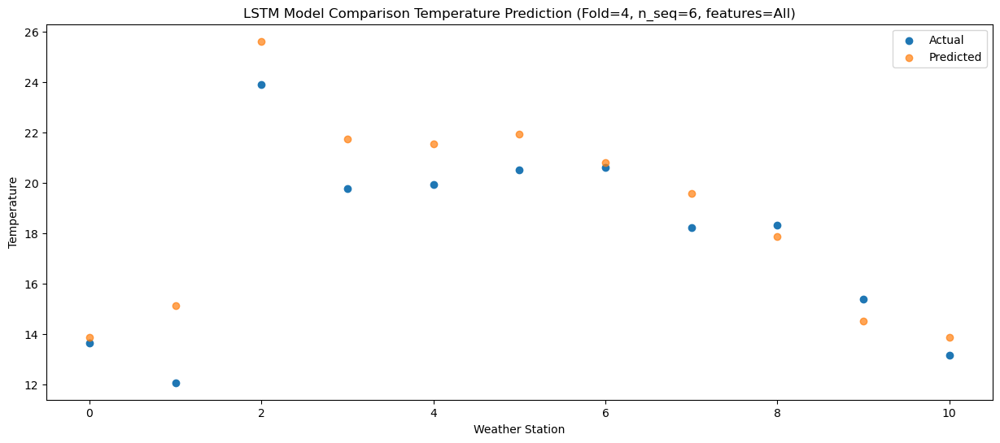

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  18.734901
1                 1   16.10  20.004901
2                 2   28.36  30.494901
3                 3   23.92  26.604901
4                 4   23.45  26.424901
5                 5   25.99  26.804901
6                 6   24.04  25.674901
7                 7   22.25  24.434901
8                 8   22.73  22.754901
9                 9   20.14  19.374901
10               10   17.68  18.734901


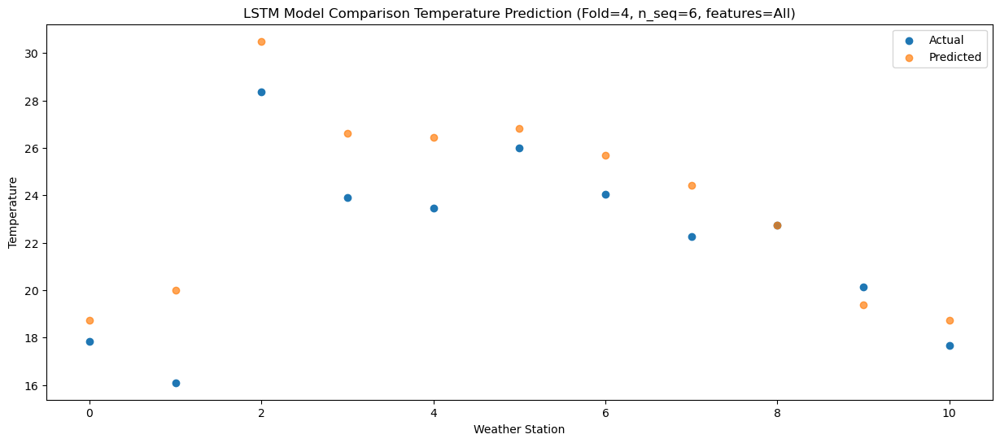

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74   24.63057
1                 1   17.73   25.90057
2                 2   32.62   36.39057
3                 3   29.60   32.50057
4                 4   30.30   32.32057
5                 5   30.95   32.70057
6                 6   28.06   31.57057
7                 7   28.55   30.33057
8                 8   29.97   28.65057
9                 9   27.53   25.27057
10               10   24.57   24.63057


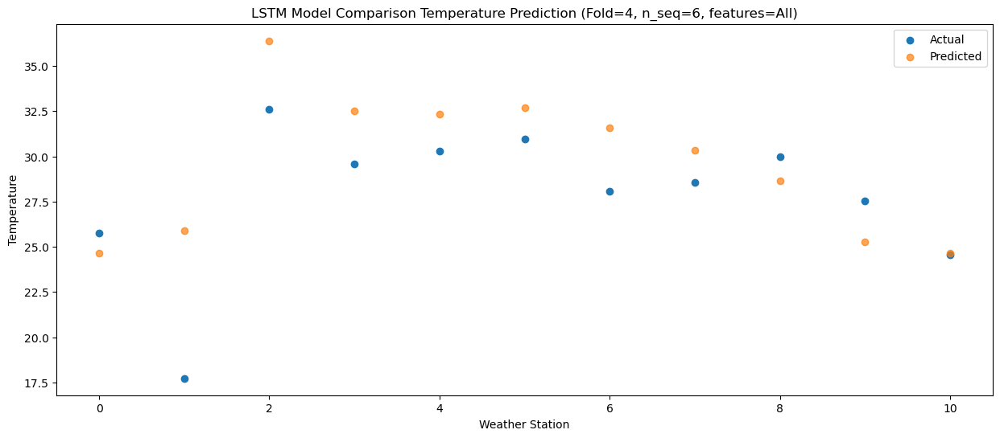

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]]
[[ 2.58094275  3.85094275 14.34094275 10.45094275 10.27094275 10.65094275
   9.52094275  8.28094275  6.60094275  3.22094275  2.58094275]
 [ 1.84800785  3.11800785 13.60800785  9.71800785  9.53800785  9.91800785
   8.78800785  7.54800785  5.86800785  2.48800785  1.84800785]
 [ 9.68074387 10.95074387 21.44074387 17.55074387 17.37074387 17.75074387
  16.62074387 15.38074387 13.70074387 10.32074387  9.68074387]
 [13.85716217 15.12716217 25.61716217 21.72716217 21.54716217 21.92716217
  20.79716217 19.55716217 17.87716217 14.49716217 13.85716217]
 [18.73490065 20.00490065 30.49

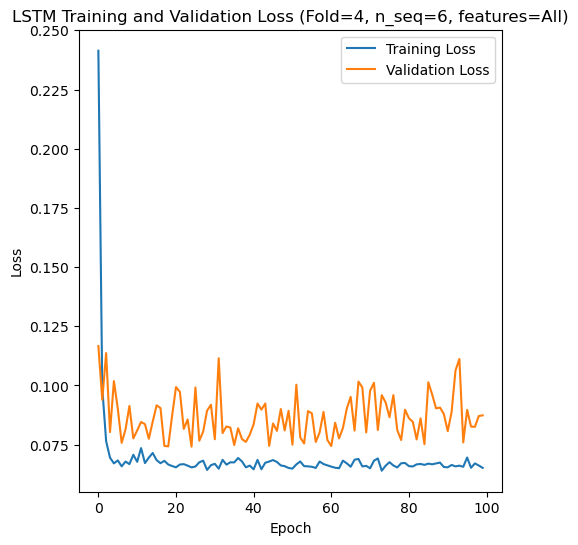

[[2.1274464517010085], [1.8226143037978293], [4.597445971749584], [2.9834196237975554], [2.3030169858276093]]
[[array(2.12744645)], [array(1.8226143)], [array(4.59744597)], [array(2.98341962)], [array(2.30301699)]]
[[1.6528565058112141], [1.5109864042022014], [3.2495734336881914], [2.092302575400381], [1.7130133309870055]]
[[0.3377944406574022], [0.11036375948580615], [0.23733808194918662], [0.37623912835001494], [0.2606899604418051]]
[[0.9257483535843126], [0.9407824110269836], [0.6900918812781808], [0.8787036094558431], [0.932467755422689]]
[[array(0.05173402)], [array(0.11036376)], [array(0.23733808)], [array(0.31357689)], [array(0.01803131)]]
[[array(0.95023553)], [array(0.96128329)], [array(0.85615444)], [array(0.91717904)], [array(0.94431614)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 12.87 12.78 17.84 19.24 23.26 26.74
 15.34 16.2  22.18 23.82 27.8  31.94  9.    7.43 15.34 17.13 21.1  24.38
 13.35 10.26 20.16 22.09 25.95 31.15 11.52 12.17 17.07 20.44 23.95 28.52
 10.21 10.85 17.83 1

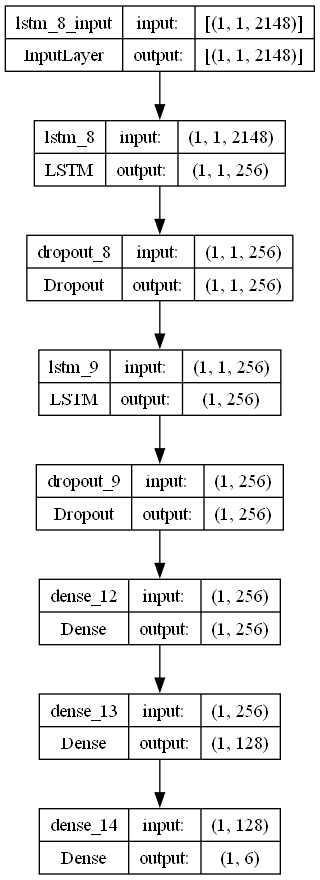

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr = 0.022034939316289883
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 256
    dropout_rate = 0.48093551450042776

    # design network
    model = Sequential()
    #model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S6.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)